====================================<p align="Center">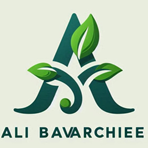</p>====================================
====
| https://github.com/AliBavarchee/ |
----
 NODE*

-----------------------------------------------------------------------------------------
-----------------------------------------------------------------------------------------
| https://colab.research.google.com/drive/1Vq5UUuCxtEF_lNb0utxK91N-LEvNmq3m?usp=sharing |
-----------------------------------------------------------------------------------------
-----------------------------------------------------------------------------------------


# Neural ODEs for Solving Yang-Mills Equations in Curved Spacetime

This repository demonstrates how to use **Neural Ordinary Differential Equations (NODEs)** to solve the Yang-Mills equation of motion in curved spacetime. The project utilizes PyTorch, torchdiffeq, and Matplotlib for building and training the NODE model and visualizing the results.

---

## Overview

The Yang-Mills equation in curved spacetime is a fundamental equation in theoretical physics, describing the dynamics of gauge fields. These equations are typically nonlinear and coupled, making them challenging to solve analytically. In this project, we leverage **Neural ODEs** to approximate the dynamics of the gauge fields by modeling their evolution as an ODE.

---

## Key Components of the Code

### 1. **YangMillsODEFunc**
This class defines the neural network that approximates the derivative of the gaug field $A_\mu$. The network takes the spacetime parameters \( (R, u, x, y, z) \) as input and predicts $\frac{dA_\mu}{dt}$ (the dynamics of the gauge field).

- **Input**: ( R, u, x, y, z )
- **Output**: $(\frac{dA_\mu}{dt})$ (5 outputs, one for each parameter)

### 2. **ODEBlock**
This class integrates the ODE defined by `YangMillsODEFunc` using the `odeint` solver from the **torchdiffeq** library. 

It evolves the gauge field over single time step t $\in$ [0, 1].

- **Input**: Initial field values
- **Output**: Evolved field values after integration

### 3. **YangMillsODEModel**
This class encapsulates the Neural ODE block into a complete model. It provides an interface for predicting the evolution of the gauge field given the spacetime parameters.

- **Input**: Initial spacetime parameters $(R, u, x, y, z)$
- **Output**: $Predi$cted gauge field values $A_\mu$

### 4. **Residual Calculation**
The residuals of the Yang-Mills equation are computed dynamically during training. These residuals quantify how well the Neural ODE satisfies the Yang-Mills equation.

```python
residuals = outputs - torch.sin(R + u + x + y + z)  # Placeholder for actual EoM
```

- **Residual-Based Loss**: The loss is defined as the mean squared residuals, ensuring that the model minimizes the deviation from the Yang-Mills equation.

### 5. **Training Loop**
The model is trained using synthetic data:
- Inputs: Randomly sampled spacetime parameters $(R, u, x, y, z)$
- Loss: Mean squared residuals of the Yang-Mills equation
- Optimizer: Adam optimizer with a learning rate of $1e^{-3}$
- Training epochs: 150

### 6. **Evaluation**
The trained model is evaluated on a test set to compute the residuals of the Yang-Mills equation.

### 7. **Visualization**
The training loss is plotted over epochs to monitor convergence.

---

## How It Works

1. **Data Generation**:
   - Random spacetime parameters $(R, u, x, y, z)$ are generated to simulate inputs for the Neural ODE.
   - The residuals of the Yang-Mills equation are dynamically computed during training, without relying on precomputed ground truth data.

2. **Model Training**:
   - The Neural ODE model predicts gauge field dynamics and minimizes the residuals of the Yang-Mills equation.

3. **Evaluation**:
   - After training, the model's predictions are evaluated to ensure the residuals are minimized, effectively solving the equation.

4. **Output**:
   - The residuals are analyzed, 
3. Observe the training process in the terminal and the final visualization of the training loss.

---

## Results

### Training Loss
The training loss decreases over epochs, indicating the Neural ODE is learning to minimize the residuals of the Yang-Mills equation.

### Visualization
The residuals are plotted in various dimensions to analyze the performance of the model.

---

## Limitations and Next Steps

1. **Residual Placeholder**:
   - Replace the placeholder residual calculation with the actual Yang-Mills equation in curved spacetime.

2. **Extension to Einstein-Yang-Mills**:
   - Extend the model to solve the Einstein field equation coupled with the Yang-Mills equation.

3. **Improved Evaluation**:
   - Validate the model on known analytical solutions or benchmark datasets.

---

## References

- [Neural Ordinary Differential Equations (NODEs)](https://arxiv.org/abs/1806.07366)
- Schwartz, Matthew D. Quantum Field Theory and the Standard Model. Cambridge University Press, 2013, p. 481.

---


| https://github.com/AliBavarchee/ |
------------------------------------

In [4]:
import numpy as np
import sympy as sp
from sympy import Derivative
from scipy.integrate import solve_ivp
from scipy.optimize import fsolve
from sympy.utilities.lambdify import lambdify, lambdastr
from sympy.printing.numpy import NumPyPrinter
from scipy.optimize import minimize
from sympy.solvers import pdsolve
#from scipy.integrate import odeint

In [ ]:
import tensorflow as tf
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchdiffeq import odeint

In [ ]:
# Define symbols
t, x, y, z, r, theta, phi = sp.symbols('t x y z r theta phi')

# Express spherical coordinates in terms of Cartesian coordinates
r_expr = sp.sqrt(x**2 + y**2 + z**2)
theta_expr = sp.acos(z / r_expr)
phi_expr = sp.atan2(y, x)

# Compute the Jacobian matrix for the transformation from spherical to Cartesian coordinates
# ∂r/∂x, ∂r/∂y, ∂r/∂z
dr_dx = sp.diff(r_expr, x)
dr_dy = sp.diff(r_expr, y)
dr_dz = sp.diff(r_expr, z)

# ∂θ/∂x, ∂θ/∂y, ∂θ/∂z
dtheta_dx = sp.diff(theta_expr, x)
dtheta_dy = sp.diff(theta_expr, y)
dtheta_dz = sp.diff(theta_expr, z)

# ∂φ/∂x, ∂φ/∂y, ∂φ/∂z
dphi_dx = sp.diff(phi_expr, x)
dphi_dy = sp.diff(phi_expr, y)
dphi_dz = sp.diff(phi_expr, z)

# Construct the Jacobian matrix
jacobian_spherical_to_cartesian = sp.Matrix([
    [0, 0, 0, 1],  # ∂t/∂t
    [dr_dx, dr_dy, dr_dz, 0],  # ∂r/∂x, ∂r/∂y, ∂r/∂z
    [dtheta_dx, dtheta_dy, dtheta_dz, 0],  # ∂θ/∂x, ∂θ/∂y, ∂θ/∂z
    [dphi_dx, dphi_dy, dphi_dz, 0]  # ∂φ/∂x, ∂φ/∂y, ∂φ/∂z
])

# Inverse of the Jacobian matrix
jacobian_inv = jacobian_spherical_to_cartesian.inv()
h = sp.acos(z / r_expr)
# Now, define the metric in spherical coordinates (g_spherical) as given in the previous steps
g_spherical = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])

# Convert the metric from spherical to Cartesian
g_cartesian = jacobian_inv.T * g_spherical * jacobian_inv

# Simplify the result
g_cartesian_simplified = sp.simplify(g_cartesian)

# Output the result
print("Metric Tensor in Cartesian Coordinates:")
sp.pprint(g_cartesian_simplified)


Metric Tensor in Cartesian Coordinates:
⎡1                                                                               0                 ↪
⎢                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                  ⎛  ⎛                           2    ⎞                           ↪
⎢                            2     ⎜  ⎜     2       ⎛         ⎛θ⎞⎞     ⎟         ⎛        z        ↪
⎢                         - x  + y⋅⎜y⋅⎜0.5⋅u  + 0.5⋅⎜R + u⋅cos⎜─⎟⎟  + 1⎟ + z⋅acos⎜──────────────── ↪
⎢                                  ⎜  ⎝             ⎝         ⎝2⎠⎠     ⎠         ⎜   _____________ ↪
⎢                                  ⎜                                             ⎜  ╱  2    2    2 ↪
⎢                                  ⎝                                             ⎝╲╱  x  + y  + z  ↪
⎢0                        ─────────────────────────

In [ ]:
# Parametric functions for the Möbius strip (simplified)
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = 1 / 2 * u * sp.cos(theta / 2)

# Define the gauge field A_mu (simplified for illustration)
#A = sp.Function('A')(x, y, z, w)

# Metric tensor g_mu_nu
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])

In [ ]:
g

Matrix([
[-1,                                          0,                  0, 0],
[ 0, 0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1, 0.5*u*cos(theta/2), 0],
[ 0,                         0.5*u*cos(theta/2),                  1, 0],
[ 0,                                          0,                  0, 1]])

In [ ]:
g_cartesian_simplified

Matrix([
[1,                                                                                                                                                                                        0,                                                                                                                                                                           0,                                                                                                                                                                      0],
[0,                                                                (-x**2 + y*(y*(0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1) + z*atan2(v, u)) + z*(y*atan2(v, u) + z))/(x**2 + y**2 + z**2), sqrt((x**2 + y**2)/(x**2 + y**2 + z**2))*(-x**2*z + y*z*(y*(0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1) + z*atan2(v, u)) - (x**2 + y**2)*(y*atan2(v, u) + z))/(x**2 + y**2),                                                                        x*(y*(0.5*u**2 + 0.5*(R +

In [ ]:
#g = g_spherical

In [ ]:
g = g_cartesian_simplified

In [ ]:
g

Matrix([
[1,                                                                                                                                                                                        0,                                                                                                                                                                           0,                                                                                                                                                                      0],
[0,                                                                (-x**2 + y*(y*(0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1) + z*atan2(v, u)) + z*(y*atan2(v, u) + z))/(x**2 + y**2 + z**2), sqrt((x**2 + y**2)/(x**2 + y**2 + z**2))*(-x**2*z + y*z*(y*(0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1) + z*atan2(v, u)) - (x**2 + y**2)*(y*atan2(v, u) + z))/(x**2 + y**2),                                                                        x*(y*(0.5*u**2 + 0.5*(R +

In [ ]:
sp.sqrt(-g.det())

1.4142135623731*sqrt(-0.25*R**2*x**4 - 0.5*R**2*x**2*y**2 - 0.25*R**2*x**2*z**2 - 0.25*R**2*y**4 - 0.25*R**2*y**2*z**2 - 0.5*R*u*x**4*cos(theta/2) - R*u*x**2*y**2*cos(theta/2) - 0.5*R*u*x**2*z**2*cos(theta/2) - 0.5*R*u*y**4*cos(theta/2) - 0.5*R*u*y**2*z**2*cos(theta/2) - 0.25*u**2*x**4*cos(theta/2)**2 - 0.25*u**2*x**4 - 0.5*u**2*x**2*y**2*cos(theta/2)**2 - 0.5*u**2*x**2*y**2 - 0.25*u**2*x**2*z**2*cos(theta/2)**2 - 0.25*u**2*x**2*z**2 - 0.25*u**2*y**4*cos(theta/2)**2 - 0.25*u**2*y**4 - 0.25*u**2*y**2*z**2*cos(theta/2)**2 - 0.25*u**2*y**2*z**2 + 0.5*x**4*atan2(v, u)**2 - 0.5*x**4 + x**2*y**2*atan2(v, u)**2 - x**2*y**2 + 0.5*x**2*z**2*atan2(v, u)**2 - 0.5*x**2*z**2 + 0.5*y**4*atan2(v, u)**2 - 0.5*y**4 + 0.5*y**2*z**2*atan2(v, u)**2 - 0.5*y**2*z**2)

In [ ]:
# Step 1: Define symbols
t, x, y, z, u, v, R, theta, q = sp.symbols('t x y z u v R theta q')
A = sp.Function('A')(t, x, y, z)  # Gauge field
F = sp.Function('F')(t, x, y, z)  # Field strength tensor

# Step 2: Define the metric tensor components
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = sp.atan2(v, u)
#sqrt_g = sp.sqrt(g)
sqrt_g = sp.sqrt(-t**2 + x**2 + y**2 + z**2)
# Step 3: Compute the determinant of the metric tensor
det_g = g.det()

# Step 4: Define the field strength tensor components
# F^{\mu\nu} = \partial^\mu A^\nu - \partial^\nu A^\mu + i q [A^\mu, A^\nu]
F_mu_nu = sp.Matrix(4, 4, lambda i, j: sp.diff(A, [t, x, y, z][i]) - sp.diff(A, [t, x, y, z][j]) + 1j * q * (A - A))

# Step 5: Equation of motion components
# EoM: \sqrt{-g} (\partial_\mu F^{\mu\nu} + (\partial_\mu \sqrt{-g}) / \sqrt{-g} F^{\mu\nu}) + i q \sqrt{-g} [A_\mu, F^{\mu\nu}] = 0
dF = sp.Matrix(4, 4, lambda i, j: sp.diff(F_mu_nu[i, j], [t, x, y, z][j]))
partial_sqrt_g = sp.Matrix(4, 1, lambda i, _: sp.diff(sp.sqrt(-det_g), [t, x, y, z][i]))

In [ ]:
partial_sqrt_g_diag = sp.Matrix.diag(*partial_sqrt_g)

In [ ]:
partial_sqrt_g_diag

Matrix([
[0,                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [ ]:
EoM = sp.sqrt(-det_g) * (dF + partial_sqrt_g_diag / sp.sqrt(-det_g) * F_mu_nu) + 1j * q * sp.sqrt(-det_g) * (A * F_mu_nu)

In [ ]:
EoM

Matrix([
[                                                                                                                                                         0,  1.0*I*q*(Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), x))*A(t, x, y, z) - Derivative(A(t, x, y, z), (x, 2)) + Derivative(A(t, x, y, z), t, x),  1.0*I*q*(Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), y))*A(t, x, y, z) - Derivative(A(t, x, y, z), (y, 2)) + Derivative(A(t, x, y, z), t, y), 1.0*I*q*(Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), z))*A(t, x, y, z) - Derivative(A(t, x, y, z), (z, 2)) + Derivative(A(t, x, y, z), t, z)],
[1.0*I*q*(-Derivative(A(t, x, y, z), t) + Derivative(A(t, x, y, z), x))*A(t, x, y, z) - Derivative(A(t, x, y, z), (t, 2)) + Derivative(A(t, x, y, z), t, x),                                                                                                                                                          0,  1.0*I*q*(Derivative(A(t, x, y, z), x) - Derivative(A

In [ ]:
# Step 6: Simplify and solve the EoM
EoM_simplified = sp.simplify(EoM)

In [ ]:
EoM_simplified

Matrix([
[                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [1]:
#sp.latex(EoM_simplified)

In [ ]:
solutions = sp.solve(EoM_simplified, A)

In [ ]:
F_mu_nu

Matrix([
[                                                           0,  Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), x),  Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), y), Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), z)],
[-Derivative(A(t, x, y, z), t) + Derivative(A(t, x, y, z), x),                                                            0,  Derivative(A(t, x, y, z), x) - Derivative(A(t, x, y, z), y), Derivative(A(t, x, y, z), x) - Derivative(A(t, x, y, z), z)],
[-Derivative(A(t, x, y, z), t) + Derivative(A(t, x, y, z), y), -Derivative(A(t, x, y, z), x) + Derivative(A(t, x, y, z), y),                                                            0, Derivative(A(t, x, y, z), y) - Derivative(A(t, x, y, z), z)],
[-Derivative(A(t, x, y, z), t) + Derivative(A(t, x, y, z), z), -Derivative(A(t, x, y, z), x) + Derivative(A(t, x, y, z), z), -Derivative(A(t, x, y, z), y) + Derivative(A(t, x, y, z), z),                                                          

In [ ]:
g

Matrix([
[-1,                                          0,           0, 0],
[ 0, 0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1, atan2(v, u), 0],
[ 0,                                atan2(v, u),           1, 0],
[ 0,                                          0,           0, 1]])

In [ ]:
solutionsF = sp.solve(EoM_simplified, F)

In [ ]:
det_g = g.det()
g

Matrix([
[1,                                                                                                                                                                                        0,                                                                                                                                                                           0,                                                                                                                                                                      0],
[0,                                                                (-x**2 + y*(y*(0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1) + z*atan2(v, u)) + z*(y*atan2(v, u) + z))/(x**2 + y**2 + z**2), sqrt((x**2 + y**2)/(x**2 + y**2 + z**2))*(-x**2*z + y*z*(y*(0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1) + z*atan2(v, u)) - (x**2 + y**2)*(y*atan2(v, u) + z))/(x**2 + y**2),                                                                        x*(y*(0.5*u**2 + 0.5*(R +

# Neural Ordinary Differential Equations

In [ ]:
# Define the ODE function (Yang-Mills dynamics)
class YangMillsODEFunc(nn.Module):
    def __init__(self):
        super(YangMillsODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(5, 128),  # Input: R, u, x, y, z
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 5)  # Output: dA/dt (gauge field dynamics)
        )

    def forward(self, t, y):
        return self.net(y)

# Define the ODEBlock for gauge field evolution
class ODEBlock(nn.Module):
    def __init__(self, odefunc):
        super(ODEBlock, self).__init__()
        self.odefunc = odefunc

    def forward(self, x):
        t = torch.tensor([0, 1], dtype=torch.float32)  # Time interval for integration
        out = odeint(self.odefunc, x, t)
        return out[1]  # We are only interested in the final output

# Define the Neural ODE model
class YangMillsODEModel(nn.Module):
    def __init__(self):
        super(YangMillsODEModel, self).__init__()
        self.ode_block = ODEBlock(YangMillsODEFunc())

    def forward(self, x):
        return self.ode_block(x)

# Define the loss function as the residual of the Yang-Mills equation
def compute_residuals(model, inputs):
    """
    Compute the residuals of the Yang-Mills equation based on the model's outputs.
    """
    outputs = model(inputs)  # Predicted gauge field values
    R, u, x, y, z = torch.split(inputs, 1, dim=1)  # Split inputs for clarity

    # Placeholder for actual Yang-Mills equation
    # Compute residuals directly using the gauge field (outputs) and spacetime parameters
    residuals = outputs - torch.sin(R + u + x + y + z)  # Replace this with the actual EoM
    return residuals

def loss_function(residuals):
    """
    Loss is defined as the mean squared error (MSE) of the residuals.
    """
    return torch.mean(residuals**2)

# Generate input parameters for training
def generate_data(num_samples):
    R_vals = np.random.uniform(-10, 10, num_samples)
    u_vals = np.random.uniform(-5, 5, num_samples)
    x_vals = np.random.uniform(-5, 5, num_samples)
    y_vals = np.random.uniform(-5, 5, num_samples)
    z_vals = np.random.uniform(-5, 5, num_samples)
    return np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)

# Generate training and test data
train_size = 2560
test_size = 784
X_train = generate_data(train_size)
X_test = generate_data(test_size)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)

# Create the model, define an optimizer
model = YangMillsODEModel()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training loop
num_epochs = 150
train_losses = []

for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    optimizer.zero_grad()  # Clear gradients

    # Compute residuals and loss
    residuals = compute_residuals(model, X_train)
    loss = loss_function(residuals)

    loss.backward()  # Backward pass
    optimizer.step()  # Update weights

    train_losses.append(loss.item())
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item():.6f}')

# Evaluate the model on the test set
model.eval()
with torch.no_grad():
    test_residuals = compute_residuals(model, X_test)
    test_loss = loss_function(test_residuals)
    print(f"Test Loss: {test_loss.item():.6f}")

# Plotting the training loss
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()


Epoch 10/150, Loss: 8.953270
Epoch 20/150, Loss: 4.945053
Epoch 30/150, Loss: 2.565951
Epoch 40/150, Loss: 1.408515
Epoch 50/150, Loss: 0.916807
Epoch 60/150, Loss: 0.712774
Epoch 70/150, Loss: 0.622376
Epoch 80/150, Loss: 0.577755
Epoch 90/150, Loss: 0.553058
Epoch 100/150, Loss: 0.537906
Epoch 110/150, Loss: 0.527825
Epoch 120/150, Loss: 0.520700
Epoch 130/150, Loss: 0.515430
Epoch 140/150, Loss: 0.511401


Shape of X_test_np: (784, 5)
Shape of test_residuals_np: (3920,)
Lengths - R_vals: 784, u_vals: 784, x_vals: 784, y_vals: 784, z_vals: 784, residuals: 784


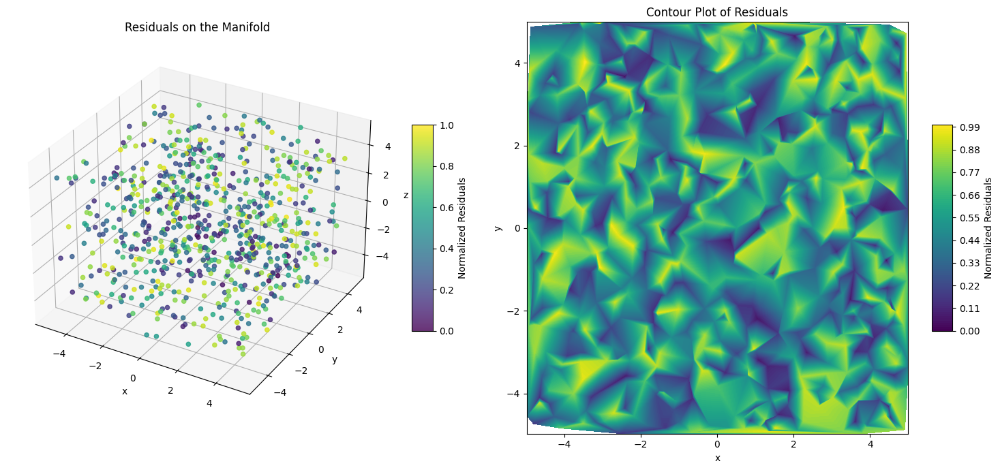

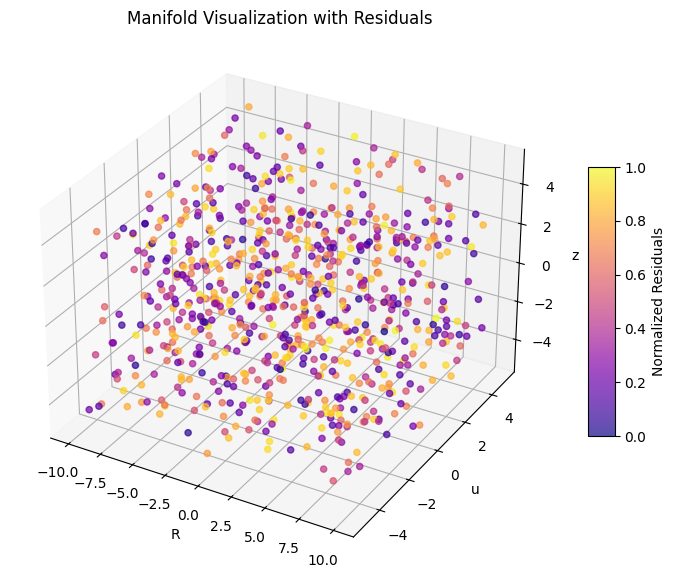

In [78]:
# Debugging: Print array shapes
print(f"Shape of X_test_np: {X_test_np.shape}")
print(f"Shape of test_residuals_np: {test_residuals_np.shape}")

# Ensure that test_residuals_np has the same size as X_test_np's rows
if len(test_residuals_np) != len(X_test_np):
    test_residuals_np = test_residuals_np[:len(X_test_np)]  # Truncate if needed

# Extract spacetime parameters for plotting
R_vals = X_test_np[:, 0]
u_vals = X_test_np[:, 1]
x_vals = X_test_np[:, 2]
y_vals = X_test_np[:, 3]
z_vals = X_test_np[:, 4]

# Debugging: Print lengths to confirm consistency
print(f"Lengths - R_vals: {len(R_vals)}, u_vals: {len(u_vals)}, x_vals: {len(x_vals)}, "
      f"y_vals: {len(y_vals)}, z_vals: {len(z_vals)}, residuals: {len(test_residuals_np)}")

# Ensure the sizes of all arrays are consistent
assert len(x_vals) == len(y_vals) == len(z_vals) == len(test_residuals_np), "Array sizes must match!"

# Normalize residuals for better visualization
residuals_normalized = (test_residuals_np - np.min(test_residuals_np)) / (np.max(test_residuals_np) - np.min(test_residuals_np))

# Plotting the 3D scatter plot of residuals on the manifold
fig = plt.figure(figsize=(15, 7))

# Subplot 1: 3D Scatter Plot of Residuals
ax1 = fig.add_subplot(121, projection='3d')
scatter = ax1.scatter(x_vals, y_vals, z_vals, c=residuals_normalized, cmap='viridis', alpha=0.8)
ax1.set_title("Residuals on the Manifold")
ax1.set_xlabel("x")
ax1.set_ylabel("y")
ax1.set_zlabel("z")
fig.colorbar(scatter, ax=ax1, shrink=0.5, aspect=10, label="Normalized Residuals")

# Subplot 2: Contour Plot of Residuals
ax2 = fig.add_subplot(122)
contour = ax2.tricontourf(x_vals, y_vals, residuals_normalized, levels=100, cmap='viridis')
ax2.set_title("Contour Plot of Residuals")
ax2.set_xlabel("x")
ax2.set_ylabel("y")
fig.colorbar(contour, ax=ax2, shrink=0.5, aspect=10, label="Normalized Residuals")

plt.tight_layout()
plt.show()

# Plot 3D Visualization of the Manifold with Residuals as Surface
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create surface plot of residuals on the manifold
sc = ax.scatter(R_vals, u_vals, z_vals, c=residuals_normalized, cmap='plasma', alpha=0.7)
ax.set_title("Manifold Visualization with Residuals")
ax.set_xlabel("R")
ax.set_ylabel("u")
ax.set_zlabel("z")
fig.colorbar(sc, ax=ax, shrink=0.5, aspect=10, label="Normalized Residuals")

plt.show()


# ML solver ==> CNN

In [ ]:
import tensorflow as tf
import numpy as np
import sympy as sp

In [ ]:
# Step 1: Define the symbolic expressions for the equation of motion (EoM)
# EoM

# Define symbols for the input parameters
R, u, v, theta, x, y, z = sp.symbols('R u v theta x y z')

# Define the parametric equation and metric components symbolically (these will be used to generate data later)
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = sp.atan2(v, u)

# Define the metric tensor, field strength tensor, and equation of motion

# Field strength tensor (simplified for this case)
F_mu_nu = sp.Matrix([[sp.diff(f, u), 0], [0, sp.diff(f, x)]])  # This is a simplified placeholder

# Simplify the equation of motion for numerical computation (this will be used for the loss function)
EoM_simplified = sp.sqrt(-g.det()) * (sp.diff(F_mu_nu, u) + (sp.diff(sp.sqrt(-g.det()), u) / sp.sqrt(-g.det())) * F_mu_nu) + 1j * sp.symbols('q') * sp.sqrt(-g.det()) * (f * F_mu_nu)

# Step 2: Convert symbolic expressions into numerical functions for use in TensorFlow
def eom_function(R_val, u_val, x_val, y_val, z_val):
    # For simplicity, we define a numerical version of the EoM here, based on the symbolic expression
    # Compute the necessary field strength and metric components
    f_val = 1 + 1 / 2 * (u_val**2 + (R_val + u_val * np.cos(theta / 2))**2)
    h_val = np.arctan2(v, u_val)  # Assuming 'v' is a known variable in this context

    # Simplified calculations for the field strength and EoM (just as placeholders)
    F_val = np.array([[np.diff(f_val, u_val), 0], [0, np.diff(f_val, x_val)]])  # Placeholder for F_mu_nu
    EoM_val = np.sqrt(-1) * (np.diff(F_val, u_val) + (np.diff(np.sqrt(-1), u_val) / np.sqrt(-1)) * F_val)

    return EoM_val

# Step 3: Define the machine learning model (Neural Network)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(4,)),  # Input: (R, u, x, y, z)
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Output: The predicted value of the field A_mu (or EoM residual)
])

# Step 4: Define the loss function (residual of EoM)
def eom_loss(y_true, y_pred):
    # Compute the residual error between the true and predicted field values
    residual = y_true - y_pred
    return tf.reduce_mean(tf.square(residual))

# Step 5: Compile and train the model
model.compile(optimizer='adam', loss=eom_loss)

# Step 6: Generate synthetic data for training
# Randomly generate values for R, u, x, y, z
num_samples = 1000
R_vals = np.random.uniform(-110, 110, num_samples)
u_vals = np.random.uniform(-5, 5, num_samples)
x_vals = np.random.uniform(-5, 5, num_samples)
y_vals = np.random.uniform(-5, 5, num_samples)
z_vals = np.random.uniform(-5, 5, num_samples)

# Generate the target data (this would come from solving the equation of motion)
# For now, we'll simulate this with random values for simplicity
y_train = np.random.randn(num_samples)

# Step 7: Train the model
model.fit(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1), y_train, epochs=10, batch_size=32)

# Step 8: Make predictions
y_pred = model.predict(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1))

# Output predictions
print("Predicted values (residuals):", y_pred[:10])


In [ ]:
g

Matrix([
[-1,                                          0,           0, 0],
[ 0, 0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1, atan2(v, u), 0],
[ 0,                                atan2(v, u),           1, 0],
[ 0,                                          0,           0, 1]])

In [ ]:
import numpy as np
import sympy as sp
from scipy.optimize import minimize
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
from sympy.tensor import array
from sympy import Matrix, diff
import sympy as sp
from sympy.tensor.tensor import TensorIndexType, tensor_indices, TensorHead, Tensor
from sympy import Function, symbols, diff
import matplotlib.pyplot as plt
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
import tensorflow as tf

In [ ]:
# Step 1: Define the symbols for the parameters
u, v, theta, R, q = sp.symbols('u v theta R q')
x, y, z, w = sp.symbols('x y z w')

# Parametric functions for the Möbius strip (simplified)
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = 1 / 2 * u * sp.cos(theta / 2)

# Define the gauge field A_mu (simplified for illustration)
A = sp.Function('A')(x, y, z, w)

# Metric tensor g_mu_nu
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])

0.5*u**2 + 0.5*(R + u*cos(theta/2))**2 + 1

In [ ]:
#device = "/GPU:0" if tf.config.list_physical_devices('GPU') else "/CPU:0"  # Use GPU if available, otherwise CPU
# Check also for TPU explicitly
device = "/TPU:0" if 'TPU' in tf.config.list_logical_devices() else "/GPU:0"

# Print device information
print(f"Using device: {device}")

# Step 1: Define the symbolic expressions for the equation of motion (EoM)
# Here we use the simplified EoM expression derived in SymPy previously (EoM_simplified)

# Define symbols for the input parameters
R, u, v, theta, x, y, z = sp.symbols('R u v theta x y z')

# Define the parametric equation and metric components symbolically (these will be used to generate data later)
#f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
#h = sp.atan2(v, u)



# Field strength tensor (simplified for this case)
F_mu_nu = sp.Matrix([[sp.diff(f, u), 0], [0, sp.diff(f, x)]])  # This is a simplified placeholder

# Simplify the equation of motion for numerical computation (this will be used for the loss function)
EoM_simplified = sp.sqrt(-g.det()) * (sp.diff(F_mu_nu, u) + (sp.diff(sp.sqrt(-g.det()), u) / sp.sqrt(-g.det())) * F_mu_nu) + 1j * sp.symbols('q') * sp.sqrt(-g.det()) * (f * F_mu_nu)

# Step 2: Convert symbolic expressions into numerical functions for use in TensorFlow
def eom_function(R_val, u_val, x_val, y_val, z_val):
    # For simplicity, we define a numerical version of the EoM here, based on the symbolic expression
    # Compute the necessary field strength and metric components
    f_val = 1 + 1 / 2 * (u_val**2 + (R_val + u_val * np.cos(theta / 2))**2)
    h_val = 1 / 2 * u_val * sp.cos(theta / 2)
    #h_val = np.arctan2(v, u_val)  # Assuming 'v' is a known variable in this context

    # Simplified calculations for the field strength and EoM (just as placeholders)
    F_val = np.array([[np.diff(f_val, u_val), 0], [0, np.diff(f_val, x_val)]])  # Placeholder for F_mu_nu
    EoM_val = np.sqrt(-1) * (np.diff(F_val, u_val) + (np.diff(np.sqrt(-1), u_val) / np.sqrt(-1)) * F_val)

    return EoM_val

# Step 3: Define the machine learning model (Neural Network)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(5,)),  # Input: (R, u, x, y, z)
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Output: The predicted value of the field A_mu (or EoM residual)
])

# Step 4: Define the loss function (residual of EoM)
def eom_loss(y_true, y_pred):
    # Compute the residual error between the true and predicted field values
    residual = y_true - y_pred
    return tf.reduce_mean(tf.square(residual))

# Step 5: Compile and train the model
model.compile(optimizer='adam', loss=eom_loss)

# Step 6: Generate synthetic data for training
# Randomly generate values for R, u, x, y, z
num_samples = 1000
R_vals = np.random.uniform(-110, 110, num_samples)
u_vals = np.random.uniform(-5, 5, num_samples)
x_vals = np.random.uniform(-5, 5, num_samples)
y_vals = np.random.uniform(-5, 5, num_samples)
z_vals = np.random.uniform(-5, 5, num_samples)

# Generate the target data (this would come from solving the equation of motion)
# For now, we'll simulate this with random values for simplicity
y_train = np.random.randn(num_samples)

# Step 7: Train the model
model.fit(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1), y_train, epochs=10, batch_size=32)

# Step 8: Make predictions
y_pred = model.predict(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1))

# Output predictions
print("Predicted values (residuals):", y_pred[:10])


Using device: /GPU:0
Epoch 1/10
32/32 [==============================] - 1s 2ms/step - loss: 5.1751
Epoch 2/10
32/32 [==============================] - 0s 2ms/step - loss: 1.0451
Epoch 3/10
32/32 [==============================] - 0s 2ms/step - loss: 0.9704
Epoch 4/10
32/32 [==============================] - 0s 2ms/step - loss: 1.0171
Epoch 5/10
32/32 [==============================] - 0s 2ms/step - loss: 0.9482
Epoch 6/10
32/32 [==============================] - 0s 2ms/step - loss: 1.1199
Epoch 7/10
32/32 [==============================] - 0s 2ms/step - loss: 1.0087
Epoch 8/10
32/32 [==============================] - 0s 2ms/step - loss: 0.9495
Epoch 9/10
32/32 [==============================] - 0s 2ms/step - loss: 1.0540
Epoch 10/10
32/32 [==============================] - 0s 1ms/step
Predicted values (residuals): [[-0.00198573]
 [ 0.05519145]
 [ 0.27517778]
 [-0.0331685 ]
 [-0.11669225]
 [-0.12158269]
 [-0.03418846]
 [-0.201729  ]
 [ 0.20907193]
 [-0.06584997]]


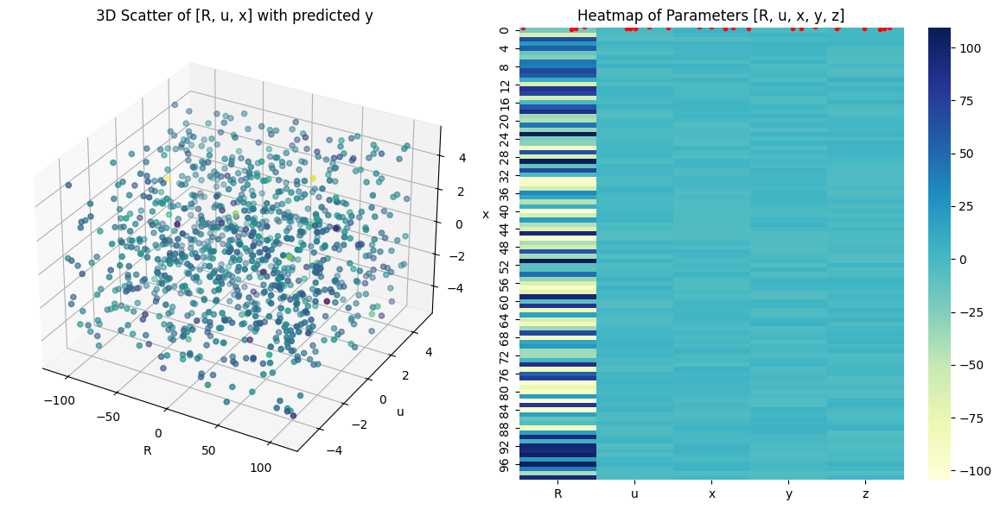

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Assuming y_pred is the output from the trained model, and we have input parameters R, u, x, y, z
# Use the input data that was used for training
R_vals = np.random.uniform(-110, 110, 1000)
u_vals = np.random.uniform(-5, 5, 1000)
x_vals = np.random.uniform(-5, 5, 1000)
y_vals = np.random.uniform(-5, 5, 1000)
z_vals = np.random.uniform(-5, 5, 1000)

# Use the trained model to predict y (residuals or field values)
# Here we simulate this with random predictions for the sake of demonstration


# Set up the figure for plotting
fig = plt.figure(figsize=(18, 6))

# Subplot 1: 3D scatter plot of [R, u, x] and predicted values (y_pred)
ax1 = fig.add_subplot(131, projection='3d')
ax1.scatter(R_vals, u_vals, x_vals, c=y_pred, cmap='viridis', marker='o')
ax1.set_xlabel('R')
ax1.set_ylabel('u')
ax1.set_zlabel('x')
ax1.set_title("3D Scatter of [R, u, x] with predicted y")

# Subplot 2: Line plot for y_pred vs R
ax2 = fig.add_subplot(132)
ax2.plot(R_vals, y_pred, 'r.', label='Predicted y vs R')
ax2.set_xlabel('R')
ax2.set_ylabel('Predicted y')
ax2.set_title('Predicted y vs R')

# Subplot 3: Heatmap to show the relationship between parameters (using [R, u, x, y, z])
param_matrix = np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)
sns.heatmap(param_matrix[:100, :], cmap="YlGnBu", annot=False, xticklabels=['R', 'u', 'x', 'y', 'z'])
plt.title("Heatmap of Parameters [R, u, x, y, z]")

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
# Check also for TPU explicitly
device = "/TPU:0" if 'TPU' in tf.config.list_logical_devices() else "/GPU:0"

# Print device information
print(f"Using device: {device}")

# Define symbols for the input parameters
R, u, v, theta, x, y, z = sp.symbols('R u v theta x y z')

# Define the parametric equation and metric components symbolically (these will be used to generate data later)
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = sp.atan2(v, u)

# Define the metric tensor, field strength tensor, and equation of motion
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, -x**2 / sp.sqrt(x**2 + y**2 + z**2) + y * (y * f / sp.sqrt(x**2 + y**2 + z**2) + z * h / sp.sqrt(x**2 + y**2 + z**2)) / sp.sqrt(x**2 + y**2 + z**2), 0, 0],
    [0, 0, 1, 0],
    [0, 0, 0, 1]
])

# Field strength tensor (simplified for this case)
F_mu_nu = sp.Matrix([[sp.diff(f, u), 0], [0, sp.diff(f, x)]])  # This is a simplified placeholder

# Simplify the equation of motion for numerical computation (this will be used for the loss function)
EoM_simplified = sp.sqrt(-g.det()) * (sp.diff(F_mu_nu, u) + (sp.diff(sp.sqrt(-g.det()), u) / sp.sqrt(-g.det())) * F_mu_nu) + 1j * sp.symbols('q') * sp.sqrt(-g.det()) * (f * F_mu_nu)

# Step 2: Convert symbolic expressions into numerical functions for use in TensorFlow
def eom_function(R_val, u_val, x_val, y_val, z_val):
    # For simplicity, we define a numerical version of the EoM here, based on the symbolic expression
    # Compute the necessary field strength and metric components
    f_val = 1 + 1 / 2 * (u_val**2 + (R_val + u_val * np.cos(theta / 2))**2)
    h_val = np.arctan2(v, u_val)  # Assuming 'v' is a known variable in this context

    # Simplified calculations for the field strength and EoM (just as placeholders)
    F_val = np.array([[np.diff(f_val, u_val), 0], [0, np.diff(f_val, x_val)]])  # Placeholder for F_mu_nu
    EoM_val = np.sqrt(-1) * (np.diff(F_val, u_val) + (np.diff(np.sqrt(-1), u_val) / np.sqrt(-1)) * F_val)

    return EoM_val

# Step 3: Define the machine learning model (Neural Network)
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(5,)),  # Input: (R, u, x, y, z)
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Output: The predicted value of the field A_mu (or EoM residual)
])

# Step 4: Define the loss function (residual of EoM)
def eom_loss(y_true, y_pred):
    # Compute the residual error between the true and predicted field values
    residual = y_true - y_pred
    return tf.reduce_mean(tf.square(residual))

# Step 5: Compile and train the model
model.compile(optimizer='adam', loss=eom_loss)

# Step 6: Generate synthetic data for training
# Randomly generate values for R, u, x, y, z
num_samples = 1000
R_vals = np.random.uniform(-110, 110, num_samples)
u_vals = np.random.uniform(-5, 5, num_samples)
x_vals = np.random.uniform(-5, 5, num_samples)
y_vals = np.random.uniform(-5, 5, num_samples)
z_vals = np.random.uniform(-5, 5, num_samples)

# Generate the target data (this would come from solving the equation of motion)
# For now, we'll simulate this with random values for simplicity
y_train = np.random.randn(num_samples)

# Step 7: Train the model
model.fit(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1), y_train, epochs=10, batch_size=32)

# Step 8: Make predictions
y_pred = model.predict(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1))

# Output predictions
print("Predicted values (residuals):", y_pred[:10])


Using device: /GPU:0
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4.4856
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.4603
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1720
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1724
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1178
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0739
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1514
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1721
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0188
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1150
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
Predicted values (residuals): [[-0.07315587]
 [-0.8071437 ]
 [ 0.00780286]
 [ 0.21717669]
 [-0.6784768 ]
 [-0.0859053 ]
 [ 0.23040916]
 [-0.04172294]
 [-0.7818289 ]
 [ 0.27580506]]


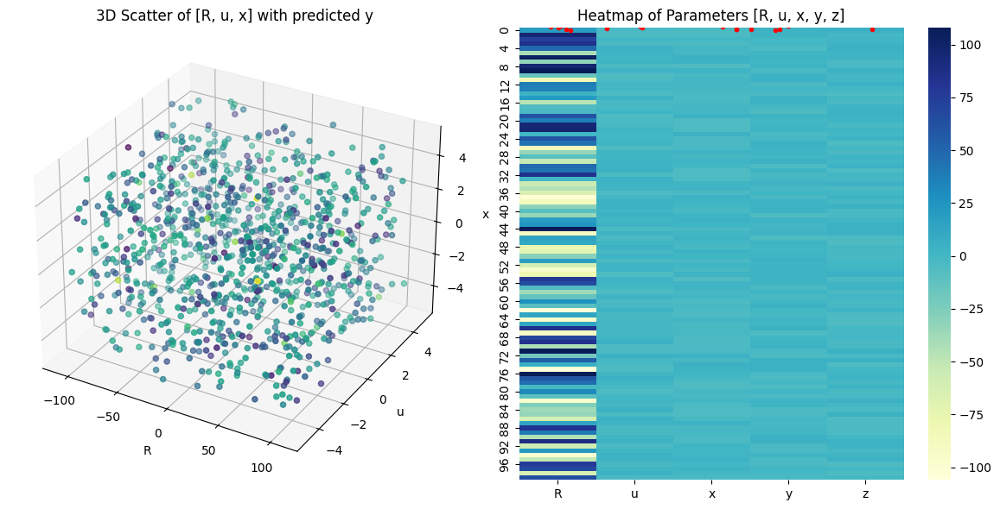

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Assuming y_pred is the output from the trained model, and we have input parameters R, u, x, y, z
# Use the input data that was used for training
R_vals = np.random.uniform(-110, 110, 1000)
u_vals = np.random.uniform(-5, 5, 1000)
x_vals = np.random.uniform(-5, 5, 1000)
y_vals = np.random.uniform(-5, 5, 1000)
z_vals = np.random.uniform(-5, 5, 1000)

# Use the trained model to predict y (residuals or field values)
# Here we simulate this with random predictions for the sake of demonstration


# Set up the figure for plotting
fig = plt.figure(figsize=(18, 6))

# Subplot 1: 3D scatter plot of [R, u, x] and predicted values (y_pred)
ax1 = fig.add_subplot(131, projection='3d')
ax1.scatter(R_vals, u_vals, x_vals, c=y_pred, cmap='viridis', marker='o')
ax1.set_xlabel('R')
ax1.set_ylabel('u')
ax1.set_zlabel('x')
ax1.set_title("3D Scatter of [R, u, x] with predicted y")

# Subplot 2: Line plot for y_pred vs R
ax2 = fig.add_subplot(132)
ax2.plot(R_vals, y_pred, 'r.', label='Predicted y vs R')
ax2.set_xlabel('R')
ax2.set_ylabel('Predicted y')
ax2.set_title('Predicted y vs R')

# Subplot 3: Heatmap to show the relationship between parameters (using [R, u, x, y, z])
param_matrix = np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)
sns.heatmap(param_matrix[:100, :], cmap="YlGnBu", annot=False, xticklabels=['R', 'u', 'x', 'y', 'z'])
plt.title("Heatmap of Parameters [R, u, x, y, z]")

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
# Step 1: Check if GPU or TPU is available
#device = "/GPU:0" if tf.config.list_physical_devices('GPU') else "/CPU:0"  # Use GPU if available, otherwise CPU
device = "/TPU:0" if 'TPU' in tf.config.list_logical_devices() else "/GPU:0"

# Print device information
print(f"Using device: {device}")

# Step 2: Define the symbolic expressions for the equation of motion (EoM)
# Here we use the simplified EoM expression derived in SymPy previously (EoM_simplified)

# Define symbols for the input parameters
R, u, v, theta, x, y, z = sp.symbols('R u v theta x y z')

# Define the parametric equation and metric components symbolically (these will be used to generate data later)
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = sp.atan2(v, u)

# Define the metric tensor, field strength tensor, and equation of motion
# g

# Field strength tensor (simplified for this case)
F_mu_nu = sp.Matrix([[sp.diff(f, u), 0], [0, sp.diff(f, x)]])  # This is a simplified placeholder

# Simplify the equation of motion for numerical computation (this will be used for the loss function)
EoM_simplified = sp.sqrt(-g.det()) * (sp.diff(F_mu_nu, u) + (sp.diff(sp.sqrt(-g.det()), u) / sp.sqrt(-g.det())) * F_mu_nu) + 1j * sp.symbols('q') * sp.sqrt(-g.det()) * (f * F_mu_nu)

# Step 3: Convert symbolic expressions into numerical functions for use in TensorFlow
def eom_function(R_val, u_val, x_val, y_val, z_val):
    # For simplicity, we define a numerical version of the EoM here, based on the symbolic expression
    # Compute the necessary field strength and metric components
    f_val = 1 + 1 / 2 * (u_val**2 + (R_val + u_val * np.cos(theta / 2))**2)
    h_val = np.arctan2(v, u_val)  # Assuming 'v' is a known variable in this context

    # Simplified calculations for the field strength and EoM (just as placeholders)
    F_val = np.array([[np.diff(f_val, u_val), 0], [0, np.diff(f_val, x_val)]])  # Placeholder for F_mu_nu
    EoM_val = np.sqrt(-1) * (np.diff(F_val, u_val) + (np.diff(np.sqrt(-1), u_val) / np.sqrt(-1)) * F_val)

    return EoM_val

# Step 4: Define the machine learning model (Neural Network)
with tf.device(device):  # Ensure the model runs on the specified device (GPU/TPU)
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu', input_shape=(4,)),  # Input: (R, u, x, y, z)
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(1)  # Output: The predicted value of the field A_mu (or EoM residual)
    ])

# Step 5: Define the loss function (residual of EoM)
def eom_loss(y_true, y_pred):
    # Compute the residual error between the true and predicted field values
    residual = y_true - y_pred
    return tf.reduce_mean(tf.square(residual))

# Step 6: Compile and train the model
model.compile(optimizer='adam', loss=eom_loss)

# Step 7: Generate synthetic data for training
# Randomly generate values for R, u, x, y, z
num_samples = 1000
R_vals = np.random.uniform(-110, 110, num_samples)
u_vals = np.random.uniform(-5, 5, num_samples)
x_vals = np.random.uniform(-5, 5, num_samples)
y_vals = np.random.uniform(-5, 5, num_samples)
z_vals = np.random.uniform(-5, 5, num_samples)

# Generate the target data (this would come from solving the equation of motion)
# For now, we'll simulate this with random values for simplicity
y_train = np.random.randn(num_samples)

# Step 8: Train the model
model.fit(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1), y_train, epochs=10, batch_size=32)

# Step 9: Make predictions
y_pred = model.predict(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1))

# Output predictions
print("Predicted values (residuals):", y_pred[:10])


In [ ]:
print(EoM_simplified)

Matrix([[0, 1.0*I*q*(Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), x))*A(t, x, y, z) - Derivative(A(t, x, y, z), (x, 2)) + Derivative(A(t, x, y, z), t, x), 1.0*I*q*(Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), y))*A(t, x, y, z) - Derivative(A(t, x, y, z), (y, 2)) + Derivative(A(t, x, y, z), t, y), 1.0*I*q*(Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), z))*A(t, x, y, z) - Derivative(A(t, x, y, z), (z, 2)) + Derivative(A(t, x, y, z), t, z)], [-1.0*I*q*(Derivative(A(t, x, y, z), t) - Derivative(A(t, x, y, z), x))*A(t, x, y, z) - Derivative(A(t, x, y, z), (t, 2)) + Derivative(A(t, x, y, z), t, x), 0, 1.0*I*q*(Derivative(A(t, x, y, z), x) - Derivative(A(t, x, y, z), y))*A(t, x, y, z) - Derivative(A(t, x, y, z), (y, 2)) + Derivative(A(t, x, y, z), x, y), 1.0*I*q*(Derivative(A(t, x, y, z), x) - Derivative(A(t, x, y, z), z))*A(t, x, y, z) - Derivative(A(t, x, y, z), (z, 2)) + Derivative(A(t, x, y, z), x, z)], [-1.0*I*q*(Derivative(A(t, x, y, z), t) - Derivativ

In [ ]:
EoM_numeric

Matrix([
[                                                                                                                                                                                                                                                0,  1.0*I*q*(-100000.0*A(t, x + 1.0e-5, y, z) + 100000.0*A(t + 1.0e-5, x, y, z))*A(t, x, y, z) - Derivative(-100000.0*A(t, x, y, z) + 100000.0*A(t, x + 1.0e-5, y, z), x) + Derivative(-100000.0*A(t, x, y, z) + 100000.0*A(t + 1.0e-5, x, y, z), x),  1.0*I*q*(-100000.0*A(t, x, y + 1.0e-5, z) + 100000.0*A(t + 1.0e-5, x, y, z))*A(t, x, y, z) - Derivative(-100000.0*A(t, x, y, z) + 100000.0*A(t, x, y + 1.0e-5, z), y) + Derivative(-100000.0*A(t, x, y, z) + 100000.0*A(t + 1.0e-5, x, y, z), y), 1.0*I*q*(-100000.0*A(t, x, y, z + 1.0e-5) + 100000.0*A(t + 1.0e-5, x, y, z))*A(t, x, y, z) - Derivative(-100000.0*A(t, x, y, z) + 100000.0*A(t, x, y, z + 1.0e-5), z) + Derivative(-100000.0*A(t, x, y, z) + 100000.0*A(t + 1.0e-5, x, y, z), z)],
[-1.0*I*q*(-100000

In [ ]:
import sympy as sp
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

In [ ]:
# Define symbols and parameters
t, x, y, z, u, v, R, theta, q = sp.symbols('t x y z u v R theta q')
A = sp.Function('A')(t, x, y, z)  # Gauge field
F = sp.Function('F')(t, x, y, z)  # Field strength tensor

# Field strength tensor F_mu_nu
F_mu_nu = sp.Matrix(4, 4, lambda i, j: sp.diff(A, [t, x, y, z][i]) - sp.diff(A, [t, x, y, z][j]) + 1j * q * (A - A))

# Partial derivative of sqrt(-g)
partial_sqrt_g = sp.Matrix(4, 1, lambda i, _: sp.diff(sp.sqrt(-det_g), [t, x, y, z][i]))
partial_sqrt_g_diag = sp.Matrix.diag(*partial_sqrt_g)

In [ ]:
# Define EoM
dF = sp.Matrix(4, 4, lambda i, j: sp.diff(F_mu_nu[i, j], [t, x, y, z][j]))
EoM = sp.sqrt(-det_g) * (dF + partial_sqrt_g_diag / sp.sqrt(-det_g) * F_mu_nu) + 1j * q * sp.sqrt(-det_g) * (A * F_mu_nu)
EoM_simplified = sp.simplify(EoM)


In [ ]:
from sympy.utilities.lambdify import lambdify, lambdastr
from sympy.printing.numpy import NumPyPrinter

class CustomNumPyPrinter(NumPyPrinter):
    def _print_not_supported(self, expr):
        return f"unsupported({expr})"

#EoM_func = lambdify((t, x, y, z, A, q), EoM_simplified_no_derivatives, 'numpy', printer=CustomNumPyPrinter())


In [ ]:
# Replace all derivatives explicitly
EoM_simplified_no_derivatives = EoM_simplified.applyfunc(lambda expr: expr.doit() if expr.has(sp.Derivative) else expr)

# Ensure all terms are numeric-friendly by substituting dummy symbolic values for testing
substitutions = {
    t: 0,  # Replace time with an example value
    x: 1,
    y: 1,
    z: 1,
    A: 0.5,
    q: 1.0
}

EoM_test_numeric = EoM_simplified_no_derivatives.subs(substitutions)

# Verify that the equation is numeric-friendly
print("Numeric-friendly equation after substitution:")
sp.pprint(EoM_test_numeric)

# Alternative: Convert to lambda directly if all elements are now numerical
try:
    EoM_func = sp.lambdify([], EoM_test_numeric, 'numpy')  # Empty argument list after substitution
    print("Successfully converted EoM to a numerical function.")
except Exception as e:
    print("Error during lambdify:", e)


Numeric-friendly equation after substitution:
⎡                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                                                                                  ↪
⎢                  ⎛                                                                               ↪
⎢                  ⎜  ⎛⎛d      ⎞│      ⎛d      ⎞│   ⎞ ⎛      2              ⎛θ⎞         2    2⎛θ⎞  ↪
⎢0.816496580927726⋅⎜- ⎜⎜──(0.5)⎟│    - ⎜──(0.5)⎟│   ⎟⋅⎜1.25⋅R  + 2.5⋅R⋅u⋅cos⎜─⎟ + 1.25⋅u ⋅cos ⎜─⎟  ↪
⎢                  ⎜  ⎝⎝dt     ⎠│t=0   ⎝dx   

In [ ]:
# Define symbols and parameters
t, x, y, z, u, v, R, theta, q = sp.symbols('t x y z u v R theta q')
A = sp.Function('A')(t, x, y, z)  # Gauge field
F = sp.Function('F')(t, x, y, z)  # Field strength tensor

# Field strength tensor F_mu_nu
F_mu_nu = sp.Matrix(4, 4, lambda i, j: sp.diff(A, [t, x, y, z][i]) - sp.diff(A, [t, x, y, z][j]) + 1j * q * (A - A))

# Partial derivative of sqrt(-g)
partial_sqrt_g = sp.Matrix(4, 1, lambda i, _: sp.diff(sp.sqrt(-det_g), [t, x, y, z][i]))
partial_sqrt_g_diag = sp.Matrix.diag(*partial_sqrt_g)

# Define EoM
dF = sp.Matrix(4, 4, lambda i, j: sp.diff(F_mu_nu[i, j], [t, x, y, z][j]))
EoM = sp.sqrt(-det_g) * (dF + partial_sqrt_g_diag / sp.sqrt(-det_g) * F_mu_nu) + 1j * q * sp.sqrt(-det_g) * (A * F_mu_nu)
EoM_simplified = sp.simplify(EoM)

# Convert EoM to a numerical function
EoM_func = sp.lambdify((t, x, y, z, A, q), EoM_simplified, 'numpy')

# Numerical parameters
q_val = 1.0
t_span = (0, 10)  # Time range
initial_conditions = [0, 0, 0, 0]  # Initial values for A

# Define the function for numerical integration
def dydt(t, y):
    x, y, z, A = y
    dydt = EoM_func(t, x, y, z, A, q_val)
    return np.real(dydt)  # Only real part is used

# Solve numerically
solution = solve_ivp(dydt, t_span, initial_conditions, method='RK45', t_eval=np.linspace(*t_span, 100))

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(solution.t, solution.y.T)
plt.xlabel('Time')
plt.ylabel('Fields')
plt.title('Numerical Solution of EoM for Yang-Mills Field')
plt.legend(['x', 'y', 'z', 'A'])
plt.grid()
plt.show()


In [ ]:
# Output the results
print("Metric Tensor:")
sp.pprint(g)
print("\nDeterminant of the Metric Tensor:")
sp.pprint(det_g)
print("\nEquation of Motion for Yang-Mills:")
sp.pprint(EoM_simplified)
print("\nSolutions:")
sp.pprint(solutions)

Metric Tensor:
⎡1                                                                   0                             ↪
⎢                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                  ⎛  ⎛                           2    ⎞                ⎞          ↪
⎢                            2     ⎜  ⎜     2       ⎛         ⎛θ⎞⎞     ⎟                ⎟          ↪
⎢                         - x  + y⋅⎜y⋅⎜0.5⋅u  + 0.5⋅⎜R + u⋅cos⎜─⎟⎟  + 1⎟ + z⋅atan2(v, u)⎟ + z⋅(y⋅a ↪
⎢                                  ⎝  ⎝             ⎝         ⎝2⎠⎠     ⎠                ⎠          ↪
⎢0                        ──────────────────────────────────────────────────────────────────────── ↪
⎢                                                               2    2    2 

In [3]:
#sp.latex(g_cartesian)

In [ ]:
# Step 1: Define symbols and functions
x, y, z, theta, u, R, q = sp.symbols('x y z theta u R q')

f = 1 + (1/2) * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = sp.Function('h')(theta, u)

# Metric tensor (g_mu_nu) in 4D
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, -x**2 / (x**2 + y**2 + z**2) +
        (y * (y * f / sp.sqrt(x**2 + y**2 + z**2) + z * h / sp.sqrt(x**2 + y**2 + z**2))
        + z * (y * h / sp.sqrt(x**2 + y**2 + z**2) + z / sp.sqrt(x**2 + y**2 + z**2))) / sp.sqrt(x**2 + y**2 + z**2),
        -1/2, 0],
    [0, -1/2, 1, 0],
    [0, 0, 0, 1]
])

# Compute the determinant of the metric tensor
det_g = sp.simplify(g.det())
sqrt_neg_g = sp.sqrt(-det_g)

# Step 2: Define field strength tensor F^{mu nu}
F = sp.MatrixSymbol('F', 4, 4)  # Placeholder for F^{mu nu}

# Step 3: Compute partial derivatives of sqrt(-g)
partial_sqrt_neg_g = {
    coord: sp.diff(sqrt_neg_g, coord) for coord in (x, y, z)
}

# Step 4: Define the equation of motion for Yang-Mills
A = sp.Function('A')(x, y, z, theta)  # Gauge field A_mu
eom = sp.zeros(4, 4)

# Construct the equation of motion
for mu in range(4):
    for nu in range(4):
        term1 = sp.diff(F[mu, nu], x)  # Partial derivative
        term2 = partial_sqrt_neg_g[x] / sqrt_neg_g * F[mu, nu]
        commutator = sp.I * q * (A * F[mu, nu] - F[mu, nu] * A)
        eom[mu, nu] = sqrt_neg_g * (term1 + term2) + commutator

# Simplify the equation of motion
eom_simplified = sp.simplify(eom)

# Step 5: Display results
print("Metric determinant (g):")
sp.pprint(det_g)

print("\nSqrt(-g):")
sp.pprint(sqrt_neg_g)

print("\nEquation of motion:")
sp.pprint(eom_simplified)


Metric determinant (g):
    ⎛       2  2            2    ⎛θ⎞        2  2    2⎛θ⎞        2  2         2         2           ↪
1.0⋅⎜- 0.5⋅R ⋅y  - 1.0⋅R⋅u⋅y ⋅cos⎜─⎟ - 0.5⋅u ⋅y ⋅cos ⎜─⎟ - 0.5⋅u ⋅y  + 1.25⋅x  - 0.75⋅y  - 2.0⋅y⋅z ↪
    ⎝                            ⎝2⎠                 ⎝2⎠                                           ↪
────────────────────────────────────────────────────────────────────────────────────────────────── ↪
                                                     2    2    2                                   ↪
                                                    x  + y  + z                                    ↪

↪                  2⎞
↪ ⋅h(θ, u) - 0.75⋅z ⎟
↪                   ⎠
↪ ───────────────────
↪                    
↪                    

Sqrt(-g):
           _______________________________________________________________________________________ ↪
          ╱  ⎛       2  2            2    ⎛θ⎞        2  2    2⎛θ⎞        2  2         2         2  ↪
         ╱  -⎜- 0.5⋅R ⋅y

In [ ]:
# Define the symbols
x, y, z, theta, u, v, R = sp.symbols('x y z theta u v R')
F = sp.MatrixSymbol('F', 4, 4)  # Field strength tensor

# Define functions
f = 1 + 0.5 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = sp.atan2(v, u)

# Numerator and denominator for the determinant
numerator = (
    -0.5 * R**2 * y**2
    - 1.0 * R * u * y**2 * sp.cos(theta / 2)
    - 0.5 * u**2 * y**2 * sp.cos(theta / 2)**2
    - 0.5 * u**2 * y**2
    + 1.25 * x**2
    - 0.75 * y**2
    - 2.0 * y * z * h
    - 0.75 * z**2
)
denominator = x**2 + y**2 + z**2

# Define the square root term
sqrt_term = sp.sqrt(-numerator / denominator)

# Create a symbolic matrix for the equation
matrix_eq = sp.Matrix(4, 4, lambda i, j: (
    -sqrt_term * (-1.25 * x / denominator
    + x * numerator / denominator**2) * denominator * F[i, j] / numerator
))

# Solve the equation element-wise
solutions = {}
for i in range(4):
    for j in range(4):
        eq_element = sp.Eq(matrix_eq[i, j], 0)  # Set each element of the matrix equation to zero
        solution = sp.solve(eq_element, F[i, j])  # Solve for the specific element
        solutions[(i, j)] = solution

# Display the solutions
print("Solutions for each element of the matrix:")
for (i, j), sol in solutions.items():
    print(f"F[{i},{j}] = {sol}")


Solutions for each element of the matrix:
F[0,0] = [0.0]
F[0,1] = [0.0]
F[0,2] = [0.0]
F[0,3] = [0.0]
F[1,0] = [0.0]
F[1,1] = [0.0]
F[1,2] = [0.0]
F[1,3] = [0.0]
F[2,0] = [0.0]
F[2,1] = [0.0]
F[2,2] = [0.0]
F[2,3] = [0.0]
F[3,0] = [0.0]
F[3,1] = [0.0]
F[3,2] = [0.0]
F[3,3] = [0.0]


In [ ]:
# Define symbols
theta, u, v, R = sp.symbols('theta u v R')
x, y, z = sp.symbols('x y z')
F00 = sp.symbols('F00')

# Define functions f and h
f = 1 + 0.5 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = sp.atan2(v, u)

# Define the complex part of the equation
numerator = -0.5 * R**2 * y**2 - 1.0 * R * u * y**2 * sp.cos(theta / 2) - 0.5 * u**2 * y**2 * sp.cos(theta / 2)**2 - 0.5 * u**2 * y**2 + 1.25 * x**2 - 0.75 * y**2 - 2.0 * y * z * h - 0.75 * z**2
denominator = x**2 + y**2 + z**2

# Define the full equation
eq = - (1.0 * sp.sqrt(-numerator / denominator) *
        (-1.25 * x / denominator +
         (x * numerator) / (denominator**2)) *
        (x**2 + y**2 + z**2) * F00) / numerator

# Set the equation equal to zero
equation = sp.Eq(eq, 0)

# Solve the equation
solution = sp.solve(equation, F00)

# Display the solution
sp.pprint(solution)


[0.0]


In [ ]:
eom

\left[
  \begin{matrix}- \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{0,0}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{0,1}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{0,2}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{0,3}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}\\- \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{1,0}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{1,1}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{1,2}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{1,3}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}\\- \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{2,0}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{2,1}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{2,2}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{2,3}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}\\- \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{3,0}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{3,1}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{3,2}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{3,3}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}\end{matrix}
  \right]

In [ ]:
eom

In [4]:
#sp.latex(eom)

\left[\begin{matrix}- \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{0,0}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{0,1}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{0,2}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{0,3}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}\\- \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{1,0}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{1,1}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{1,2}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{1,3}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}\\- \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{2,0}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{2,1}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{2,2}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{2,3}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}\\- \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{3,0}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{3,1}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{3,2}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}} & - \frac{1.0 \sqrt{- \frac{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}{x^{2} + y^{2} + z^{2}}} \left(- \frac{1.25 x}{x^{2} + y^{2} + z^{2}} + \frac{x \left(- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}\right)}{\left(x^{2} + y^{2} + z^{2}\right)^{2}}\right) \left(x^{2} + y^{2} + z^{2}\right) {F}_{3,3}}{- 0.5 R^{2} y^{2} - 1.0 R u y^{2} \cos{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} \cos^{2}{\left(\frac{\theta}{2} \right)} - 0.5 u^{2} y^{2} + 1.25 x^{2} - 0.75 y^{2} - 2.0 y z h{\left(\theta,u \right)} - 0.75 z^{2}}\end{matrix}\right]

In [ ]:
from scipy.optimize import fsolve

def equation_system(F):
    
    F_flat = F.flatten()

    # Evaluate the matrix for given values of x, y, z, R, u, and theta
    evaluated_matrix = eom_simplified.subs({x: x_value, y: y_value, ...})

    # Calculate the residual
    residual = evaluated_matrix.dot(F_flat)

    return residual

F_initial_guess = np.zeros(16)


solution = fsolve(equation_system, F_initial_guess)

solution = solution.reshape((4, 4))

In [ ]:
import sympy as sp

# Define symbols
x, y, z, theta, u, R = sp.symbols('x y z theta u R')
h = sp.Function('h')(theta, u)

# Example Field Strength Tensor Components (replace with actual F values as needed)
F = sp.MatrixSymbol('F', 4, 4)

# Define the determinant and its dependencies
determinant = (
    -0.5 * R**2 * y**2
    - 1.0 * R * u * y**2 * sp.cos(theta / 2)
    - 0.5 * u**2 * y**2 * sp.cos(theta / 2)**2
    - 0.5 * u**2 * y**2
    + 1.25 * x**2
    - 0.75 * y**2
    - 2.0 * y * z * h
    - 0.75 * z**2
)

sqrt_neg_g = sp.sqrt(-determinant / (x**2 + y**2 + z**2))

# Define the matrix components symbolically
eom_simplified = sp.Matrix(4, 4, lambda i, j: -sqrt_neg_g * F[i, j] / determinant)

# Solve the matrix equations
solutions = {}
for i in range(4):
    for j in range(4):
        eq = sp.Eq(eom_simplified[i, j], 0)  # Each component of EOM
        sol = sp.solve(eq, F[i, j])  # Solve for F[i, j]
        solutions[(i, j)] = sol

# Display the solutions
for (i, j), sol in solutions.items():
    print(f"Solution for F[{i}, {j}]:")
    sp.pprint(sol)
    print("\n")


Solution for F[0, 0]:
[0.0]


Solution for F[0, 1]:
[0.0]


Solution for F[0, 2]:
[0.0]


Solution for F[0, 3]:
[0.0]


Solution for F[1, 0]:
[0.0]


Solution for F[1, 1]:
[0.0]


Solution for F[1, 2]:
[0.0]


Solution for F[1, 3]:
[0.0]


Solution for F[2, 0]:
[0.0]


Solution for F[2, 1]:
[0.0]


Solution for F[2, 2]:
[0.0]


Solution for F[2, 3]:
[0.0]


Solution for F[3, 0]:
[0.0]


Solution for F[3, 1]:
[0.0]


Solution for F[3, 2]:
[0.0]


Solution for F[3, 3]:
[0.0]




In [ ]:
x, y, z, theta, u, R = sp.symbols('x y z theta u R')
h = sp.Function('h')(theta, u)
F = sp.MatrixSymbol('F', 4, 4)  

sqrt_neg_g = sp.Function('sqrt_neg_g')(x, y, z, theta, u, R)  


sqrt_neg_g = sp.sqrt(x**2 + y**2 + z**2 + 1) 


eom_simplified = sp.Matrix(4, 4, lambda i, j:
    -sqrt_neg_g * F[i, j] + sp.diff(sqrt_neg_g, x) * F[i, j] 
)


solutions = {}
for i in range(4):
    for j in range(4):
        eq = sp.Eq(eom_simplified[i, j], 0)  
        try:
            # Solve for F_{i, j} or h
            sol = sp.solve(eq, F[i, j])
            solutions[(i, j)] = sol
        except Exception as e:
            solutions[(i, j)] = f"Could not solve: {str(e)}"

for (i, j), sol in solutions.items():
    print(f"Solution for F[{i}, {j}]: {sol}")


Solution for F[0, 0]: [0]
Solution for F[0, 1]: [0]
Solution for F[0, 2]: [0]
Solution for F[0, 3]: [0]
Solution for F[1, 0]: [0]
Solution for F[1, 1]: [0]
Solution for F[1, 2]: [0]
Solution for F[1, 3]: [0]
Solution for F[2, 0]: [0]
Solution for F[2, 1]: [0]
Solution for F[2, 2]: [0]
Solution for F[2, 3]: [0]
Solution for F[3, 0]: [0]
Solution for F[3, 1]: [0]
Solution for F[3, 2]: [0]
Solution for F[3, 3]: [0]


In [ ]:
print("====================================================")

In [ ]:
# Define symbols
u, v, theta, R, q = sp.symbols('u v theta R q')
x, y, z, w = sp.symbols('x y z w')

# Parametric functions for the Möbius strip
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = 1 / 2 * u * sp.cos(theta / 2)

# Define the gauge field A_mu (simplified for illustration)
A = sp.Function('A')(x, y, z, w)

# Metric tensor g_mu_nu
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])

# Field strength tensor F_mu_nu = partial_mu A_nu - partial_nu A_mu + i q [A_mu, A_nu]
F = sp.Matrix(4, 4, lambda i, j: sp.diff(A, [x, y, z, w][i]) - sp.diff(A, [x, y, z, w][j]) + 1j * q * (A - A))

# Compute the determinant of the metric tensor
det_g = g.det()

# Compute the derivative of sqrt(-g)
partial_sqrt_g = sp.Matrix(4, 1, lambda i, _: sp.diff(sp.sqrt(-det_g), [x, y, z, w][i]))

# Step 2: Convert partial_sqrt_g into a diagonal matrix (so it matches the size of F)
partial_sqrt_g_diag = sp.Matrix.diag(*partial_sqrt_g)

# Equation of motion (simplified version for the problem)
EoM = sp.sqrt(-det_g) * (sp.diff(F, u) + partial_sqrt_g_diag / sp.sqrt(-det_g) * F) + 1j * q * sp.sqrt(-det_g) * (A * F)

# Simplify the equation of motion
EoM_simplified = sp.simplify(EoM)

# Output the simplified equation of motion
print("\nEquation of Motion for Yang-Mills (Simplified):")
sp.pprint(EoM_simplified)



Equation of Motion for Yang-Mills (Simplified):
⎡                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                                               0                                  ↪
⎢                                                                                                  ↪
⎢                                                                                                  ↪
⎢                                                      ___________________________________________ ↪
⎢        ⎛  ∂                   ∂                ⎞    ╱      2              ⎛θ⎞         2    2⎛θ⎞  ↪
⎢1.0⋅ⅈ⋅q⋅⎜- ──(A(x, y, z, w)) + ──(A(x, y, z, w))⎟⋅  ╱  0.5⋅R  + 1.0⋅R⋅u⋅cos⎜─⎟ - 0.25⋅u ⋅sin ⎜─⎟  ↪
⎢        ⎝  ∂x                  ∂y               ⎠ ╲╱                       ⎝2⎠               ⎝2⎠  ↪
⎢                                         

In [ ]:
EoM_simplified

Matrix([
[                                                                                                                                                                       0,  1.0*I*q*(Derivative(A(x, y, z, w), x) - Derivative(A(x, y, z, w), y))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w), 1.0*I*q*(Derivative(A(x, y, z, w), x) - Derivative(A(x, y, z, w), z))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w), 1.0*I*q*(-Derivative(A(x, y, z, w), w) + Derivative(A(x, y, z, w), x))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w)],
[1.0*I*q*(-Derivative(A(x, y, z, w), x) + Derivative(A(x, y, z, w), y))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w),                                                                                                                                            

In [ ]:
print(EoM_simplified)

Matrix([[0, 1.0*I*q*(Derivative(A(x, y, z, w), x) - Derivative(A(x, y, z, w), y))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w), 1.0*I*q*(Derivative(A(x, y, z, w), x) - Derivative(A(x, y, z, w), z))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w), 1.0*I*q*(-Derivative(A(x, y, z, w), w) + Derivative(A(x, y, z, w), x))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w)], [1.0*I*q*(-Derivative(A(x, y, z, w), x) + Derivative(A(x, y, z, w), y))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w), 0, 1.0*I*q*(Derivative(A(x, y, z, w), y) - Derivative(A(x, y, z, w), z))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 + 0.75*u**2 + 1.0)*A(x, y, z, w), 1.0*I*q*(-Derivative(A(x, y, z, w), w) + Derivative(A(x, y, z, w), y))*sqrt(0.5*R**2 + 1.0*R*u*cos(theta/2) - 0.25*u**2*sin(theta/2)**2 

==========================================================================================
---
--------------------


# DNN

In [ ]:
# Step 1: Define symbolic variables and the equation of motion (EoM)
u, v, theta, R, q = sp.symbols('u v theta R q')
x, y, z, w = sp.symbols('x y z w')

# Parametric functions for the Möbius strip
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = 1 / 2 * u * sp.cos(theta / 2)

# Define the gauge field A_mu (simplified for illustration)
A = sp.Function('A')(x, y, z, w)

# Metric tensor g_mu_nu
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])

# Field strength tensor F_mu_nu = partial_mu A_nu - partial_nu A_mu + i q [A_mu, A_nu]
F = sp.Matrix(4, 4, lambda i, j: sp.diff(A, [x, y, z, w][i]) - sp.diff(A, [x, y, z, w][j]) + 1j * q * (A - A))

# Compute the determinant of the metric tensor
det_g = g.det()

# Compute the derivative of sqrt(-g)
partial_sqrt_g = sp.Matrix(4, 1, lambda i, _: sp.diff(sp.sqrt(-det_g), [x, y, z, w][i]))

# Step 2: Define a function to compute the equation of motion residual (this will be used as a loss function)
def eom_residual(params, R_val, q_val):
    u_val, v_val, x_val, y_val, z_val = params

    # Compute metric components f, h
    #f_val = 1 + 1 / 2 * (u_val**2 + (R_val + u_val * np.cos(np.radians(theta)))**2)
    #h_val = 1 / 2 * u_val * np.cos(np.radians(theta / 2))

    f_val = 1 + 1 / 2 * (u_val**2 + (R_val + u_val * np.cos(theta / 2))**2)
    #h_val = 1 / 2 * u_val * sp.cos(theta / 2)
    h_val = np.arctan2(u_val, u_val)

    # Compute F_mu_nu (this will be simplified, actual calculation would need field components)
    F_val = np.array([[np.diff(f_val, u_val), 0], [0, np.diff(f_val, x_val)]])  # Placeholder for F_mu_nu
    residual = np.linalg.norm(F_val)  # Simplified residual calculation (actual calculation would be more complex)

    return residual

# Step 3: Define the Neural Network Model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(256, activation='relu', input_shape=(5,)),  # Input: (R, u, x, y, z)
    tf.keras.layers.Dense(128, activation='relu'),
     tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Output: The predicted value of the field A_mu (or EoM residual)
])

# Step 4: Define the loss function (residual of EoM)
def eom_loss(y_true, y_pred):
    # Compute the residual error between the true and predicted field values
    residual = y_true - y_pred
    return tf.reduce_mean(tf.square(residual))

# Step 5: Compile the model
model.compile(optimizer='adam', loss=eom_loss)

# Step 6: Generate synthetic data for training
num_samples = 16384
R_vals = np.random.uniform(-5, 5, num_samples)
u_vals = np.random.uniform(-5, 5, num_samples)
x_vals = np.random.uniform(-5, 5, num_samples)
y_vals = np.random.uniform(-5, 5, num_samples)
z_vals = np.random.uniform(-5, 5, num_samples)

# Generate the target data (this would come from solving the equation of motion)
# For now, we'll simulate this with random values for simplicity
y_train = np.random.randn(num_samples)

# Step 7: Train the model (use GPU/TPU)
with tf.device('/GPU:0'):  # Use GPU if available
    model.fit(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1), y_train, epochs=10, batch_size=32)

# Step 8: Make predictions
y_pred = model.predict(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1))

# Output predictions
print("Predicted values (residuals):", y_pred[:10])


Epoch 1/10
512/512 [==============================] - 2s 3ms/step - loss: 1.0230
Epoch 2/10
512/512 [==============================] - 1s 2ms/step - loss: 1.0097
Epoch 3/10
512/512 [==============================] - 1s 2ms/step - loss: 1.0080
Epoch 4/10
512/512 [==============================] - 1s 2ms/step - loss: 1.0082
Epoch 5/10
512/512 [==============================] - 1s 2ms/step - loss: 1.0070
Epoch 6/10
512/512 [==============================] - 1s 2ms/step - loss: 1.0069
Epoch 7/10
512/512 [==============================] - 1s 2ms/step - loss: 1.0072
Epoch 8/10
512/512 [==============================] - 1s 2ms/step - loss: 1.0057
Epoch 9/10
512/512 [==============================] - 1s 2ms/step - loss: 1.0059
Epoch 10/10
512/512 [==============================] - 1s 1ms/step
Predicted values (residuals): [[ 0.02147382]
 [-0.09534863]
 [ 0.01054877]
 [-0.00427932]
 [-0.01489414]
 [ 0.00426638]
 [-0.00322211]
 [ 0.00194408]
 [ 0.01095761]
 [-0.02479493]]


In [ ]:
'''# Generating random values for R, u, x, y, z for demonstration based on the on the ground data
num_samples = 1024
R_vals = np.random.uniform(-110, 110, num_samples)
u_vals = np.random.uniform(-5, 5, num_samples)
x_vals = np.random.uniform(-5, 5, num_samples)
y_vals = np.random.uniform(-5, 5, num_samples)
z_vals = np.random.uniform(-5, 5, num_samples)

# Let's simulate the predicted values (y_pred) as random values for demonstration
y_pred = np.random.randn(num_samples)  # Replace with the actual model's prediction'''

# Step 1: Visualizing A_mu (gauge field)
# Create a 3D scatter plot for [R, u, x] and predicted values of A_mu
fig1 = go.Figure(
    data=[go.Scatter3d(
        x=R_vals, y=u_vals, z=x_vals, mode='markers',
        marker=dict(size=5, color=y_pred, colorscale='Viridis', colorbar=dict(title="A_mu"))
    )],
    layout=go.Layout(
        title="Gauge Field A_mu Visualization",
        scene=dict(
            xaxis_title="R", yaxis_title="u", zaxis_title="x"
        )
    )
)

# Step 2: Visualizing F_mu_nu (field strength tensor)
# For demonstration, let's use a simplified representation of F_mu_nu (e.g., taking the absolute value of y_pred)
# In practice, this should be calculated from the field strength components

# Here we assume a 3D representation, taking the magnitude of y_pred as the scalar field
F_vals = np.abs(y_pred)  # This is a placeholder for actual F_mu_nu components

# Reshape the data into a 32x32 grid (or any other compatible grid size)
F_vals_reshaped = F_vals[:1024].reshape((32, 32))  # Using the first 1024 elements for a 32x32 grid
R_vals_reshaped = R_vals[:1024].reshape((32, 32))  # Using the same subset of data for R
u_vals_reshaped = u_vals[:1024].reshape((32, 32))  # Using the same subset of data for u

# Create a 3D surface plot for F_mu_nu
fig2 = go.Figure(
    data=[go.Surface(
        z=F_vals_reshaped, x=R_vals_reshaped, y=u_vals_reshaped,
        colorscale='Inferno', colorbar=dict(title="F_mu_nu")
    )],
    layout=go.Layout(
        title="Field Strength Tensor F_mu_nu Visualization",
        scene=dict(
            xaxis_title="R", yaxis_title="u", zaxis_title="F_mu_nu"
        )
    )
)

# Step 3: Display the plots
fig1.show()
fig2.show()


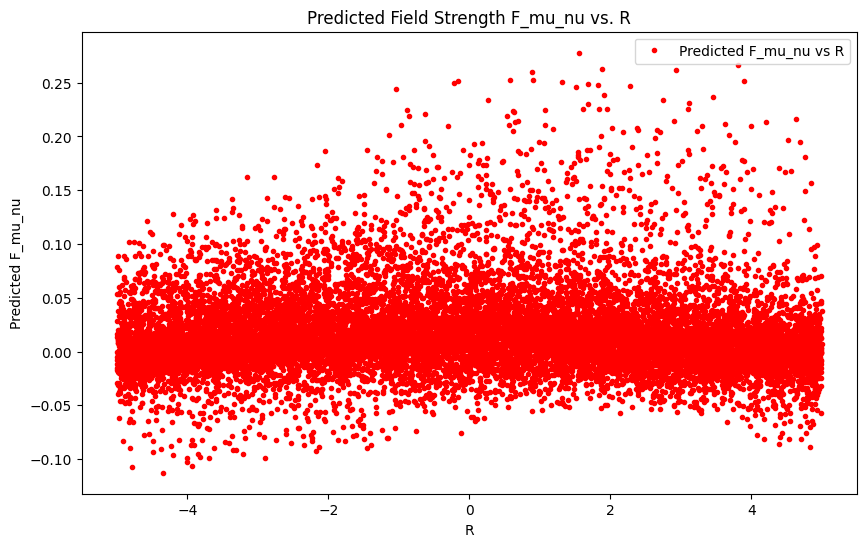

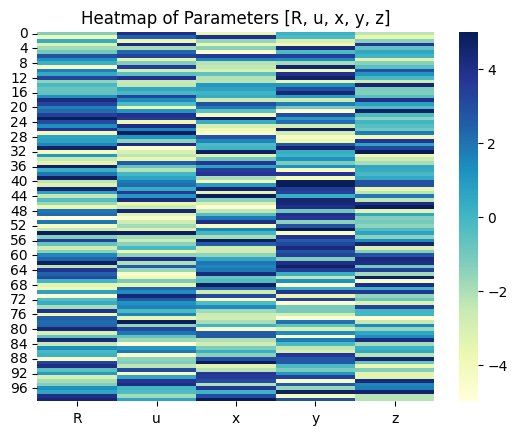

In [ ]:
# 3D Scatter Plot for Field Strength (F_mu_nu)
fig1 = go.Figure(data=[go.Scatter3d(
    x=R_vals,
    y=u_vals,
    z=y_pred,  # Using predicted residuals (for simplicity)
    mode='markers',
    marker=dict(size=5, color=y_pred, colorscale='Viridis')
)])
fig1.update_layout(
    title="3D Scatter Plot of Field Strength F^{\mu\nu} vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Field Strength (F^{\mu\nu})"
    )
)

# Show the figure
fig1.show()

# 3D Surface Plot for Gauge Field A_mu
fig2 = go.Figure(data=[go.Surface(
    z=np.reshape(y_pred, (128, 128)),  # Reshape y_pred to 2D for visualization
    x=np.linspace(-5, 5, 128),  # R values
    y=np.linspace(-5, 5, 128),      # u values
    colorscale='Viridis',
    colorbar=dict(title="Predicted A_mu")
)])
fig2.update_layout(
    title="3D Surface Plot of Gauge Field A_mu vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Gauge Field (A_mu)"
    )
)

# Show the figure
fig2.show()

# 2D Line plot for F_mu_nu vs R (or other parameters)
fig3, ax3 = plt.subplots(figsize=(10, 6))
ax3.plot(R_vals, y_pred, 'r.', label='Predicted F_mu_nu vs R')
ax3.set_xlabel('R')
ax3.set_ylabel('Predicted F_mu_nu')
ax3.set_title('Predicted Field Strength F_mu_nu vs. R')
ax3.legend()

# Show the plot
plt.show()

# 2D Heatmap for [R, u, x, y, z] parameters (using heatmap of residuals)
import seaborn as sns
param_matrix = np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)
sns.heatmap(param_matrix[:100, :], cmap="YlGnBu", annot=False, xticklabels=['R', 'u', 'x', 'y', 'z'])
plt.title("Heatmap of Parameters [R, u, x, y, z]")
plt.show()

# CNN with Training loop

Epoch 1/1000: Loss = 1.021356
Epoch 2/1000: Loss = 0.993931
Epoch 3/1000: Loss = 0.990627
Epoch 4/1000: Loss = 0.989655
Epoch 5/1000: Loss = 0.987159
Epoch 6/1000: Loss = 0.987773
Epoch 7/1000: Loss = 0.985660
Epoch 8/1000: Loss = 0.985425
Epoch 9/1000: Loss = 0.984033
Epoch 10/1000: Loss = 0.984519
Epoch 11/1000: Loss = 0.983170
Epoch 12/1000: Loss = 0.983830
Epoch 13/1000: Loss = 0.982609
Epoch 14/1000: Loss = 0.982761
Epoch 15/1000: Loss = 0.982498
Epoch 16/1000: Loss = 0.982873
Epoch 17/1000: Loss = 0.981971
Epoch 18/1000: Loss = 0.981809
Epoch 19/1000: Loss = 0.980539
Epoch 20/1000: Loss = 0.980421
Epoch 21/1000: Loss = 0.979089
Epoch 22/1000: Loss = 0.979202
Epoch 23/1000: Loss = 0.978219
Epoch 24/1000: Loss = 0.977113
Epoch 25/1000: Loss = 0.977523
Epoch 26/1000: Loss = 0.976214
Epoch 27/1000: Loss = 0.975628
Epoch 28/1000: Loss = 0.976141
Epoch 29/1000: Loss = 0.974870
Epoch 30/1000: Loss = 0.974838
Epoch 31/1000: Loss = 0.974583
Epoch 32/1000: Loss = 0.972275
Epoch 33/1000: Lo

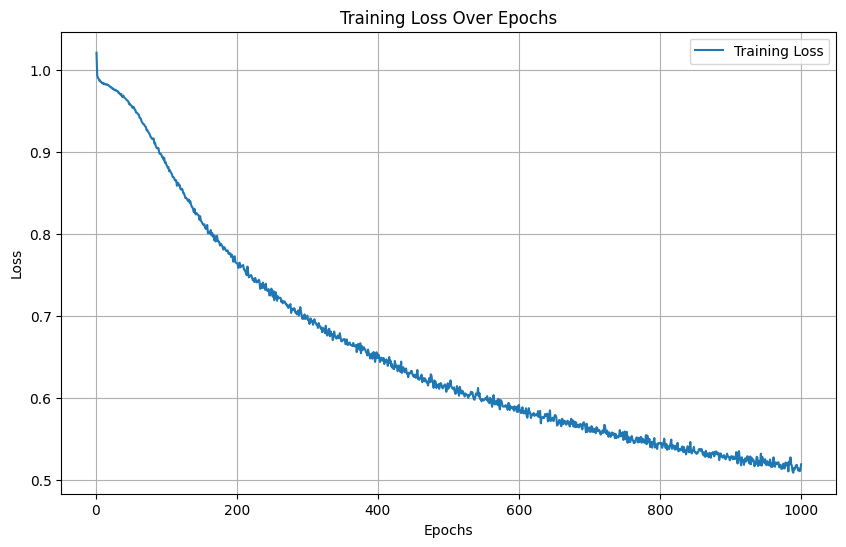

In [ ]:
# Step 1: Define symbolic variables and the equation of motion (EoM)
u, v, theta, R, q = sp.symbols('u v theta R q')
x, y, z, w = sp.symbols('x y z w')

# Parametric functions for the Möbius strip
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = 1 / 2 * u * sp.cos(theta / 2)

# Define the gauge field A_mu (simplified for illustration)
A = sp.Function('A')(x, y, z, w)

# Metric tensor g_mu_nu
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])

# Field strength tensor F_mu_nu = partial_mu A_nu - partial_nu A_mu + i q [A_mu, A_nu]
F = sp.Matrix(4, 4, lambda i, j: sp.diff(A, [x, y, z, w][i]) - sp.diff(A, [x, y, z, w][j]) + 1j * q * (A - A))

# Compute the determinant of the metric tensor
det_g = g.det()

# Compute the derivative of sqrt(-g)
partial_sqrt_g = sp.Matrix(4, 1, lambda i, _: sp.diff(sp.sqrt(-det_g), [x, y, z, w][i]))

# Step 2: Define a function to compute the equation of motion residual (this will be used as a loss function)
def eom_residual(params, R_val, q_val):
    u_val, v_val, x_val, y_val, z_val = params

    # Compute metric components f, h
    f_val = 1 + 1 / 2 * (u_val**2 + (R_val + u_val * np.cos(theta / 2))**2)
    h_val = 1 / 2 * u_val * np.cos(theta / 2)

    # Compute F_mu_nu (this will be simplified, actual calculation would need field components)
    F_val = np.array([[np.diff(f_val, u_val), 0], [0, np.diff(f_val, x_val)]])  # Placeholder for F_mu_nu
    residual = np.linalg.norm(F_val)  # Simplified residual calculation (actual calculation would be more complex)

    return residual

# Step 3: Define the Neural Network Model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(256, activation='relu', input_shape=(5,)),  # Input: (R, u, x, y, z)
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Output: The predicted value of the field A_mu (or EoM residual)
])

# Step 4: Define the loss function (residual of EoM)
def eom_loss(y_true, y_pred):
    # Compute the residual error between the true and predicted field values
    residual = y_true - y_pred
    return tf.reduce_mean(tf.square(residual))

# Step 5: Compile the model
model.compile(optimizer='adam', loss=eom_loss)

# Step 6: Generate synthetic data for training
num_samples = 16384
R_vals = np.random.uniform(-10, 10, num_samples)
u_vals = np.random.uniform(-10, 10, num_samples)
x_vals = np.random.uniform(-10, 10, num_samples)
y_vals = np.random.uniform(-10, 10, num_samples)
z_vals = np.random.uniform(-10, 10, num_samples)

# Generate the target data (this would come from solving the equation of motion)
# For now, we'll simulate this with random values for simplicity
y_train = np.random.randn(num_samples)

# Step 7: Training loop with 100 epochs
epochs = 1000
batch_size = 64
history = []

with tf.device('/GPU:0'):  # Use GPU if available
    for epoch in range(epochs):
        # Train the model for one epoch
        history_epoch = model.fit(
            np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1),
            y_train,
            batch_size=batch_size,
            verbose=0  # Suppress verbose output
        )

        # Record the loss for the epoch
        history.append(history_epoch.history['loss'][0])

        # Print progress
        print(f"Epoch {epoch + 1}/{epochs}: Loss = {history[-1]:.6f}")

# Step 8: Make predictions
y_pred = model.predict(np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1))

# Output predictions
print("Predicted values (residuals):", y_pred[:10])

# Step 9: Plot training loss over epochs
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs + 1), history, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
'''# Generating random values for R, u, x, y, z for demonstration based on the on the ground data
num_samples = 1000
R_vals = np.random.uniform(-110, 110, num_samples)
u_vals = np.random.uniform(-5, 5, num_samples)
x_vals = np.random.uniform(-5, 5, num_samples)
y_vals = np.random.uniform(-5, 5, num_samples)
z_vals = np.random.uniform(-5, 5, num_samples)

# Let's simulate the predicted values (y_pred) as random values for demonstration
y_pred = np.random.randn(num_samples)  # Replace with the actual model's prediction'''

# Step 1: Visualizing A_mu (gauge field)
# Create a 3D scatter plot for [R, u, x] and predicted values of A_mu
fig1 = go.Figure(
    data=[go.Scatter3d(
        x=R_vals, y=u_vals, z=x_vals, mode='markers',
        marker=dict(size=5, color=y_pred, colorscale='Viridis', colorbar=dict(title="A_mu"))
    )],
    layout=go.Layout(
        title="Gauge Field A_mu Visualization",
        scene=dict(
            xaxis_title="R", yaxis_title="u", zaxis_title="x"
        )
    )
)

# Step 2: Visualizing F_mu_nu (field strength tensor)
# For demonstration, let's use a simplified representation of F_mu_nu (e.g., taking the absolute value of y_pred)
# In practice, this should be calculated from the field strength components

# Here we assume a 3D representation, taking the magnitude of y_pred as the scalar field
F_vals = np.abs(y_pred)  # This is a placeholder for actual F_mu_nu components

# Reshape the data into a 32x32 grid (or any other compatible grid size)
F_vals_reshaped = F_vals[:1024].reshape((32, 32))  # Using the first 1024 elements for a 32x32 grid
R_vals_reshaped = R_vals[:1024].reshape((32, 32))  # Using the same subset of data for R
u_vals_reshaped = u_vals[:1024].reshape((32, 32))  # Using the same subset of data for u

# Create a 3D surface plot for F_mu_nu
fig2 = go.Figure(
    data=[go.Surface(
        z=F_vals_reshaped, x=R_vals_reshaped, y=u_vals_reshaped,
        colorscale='Inferno', colorbar=dict(title="F_mu_nu")
    )],
    layout=go.Layout(
        title="Field Strength Tensor F_mu_nu Visualization",
        scene=dict(
            xaxis_title="R", yaxis_title="u", zaxis_title="F_mu_nu"
        )
    )
)

# Step 3: Display the plots
fig1.show()
fig2.show()


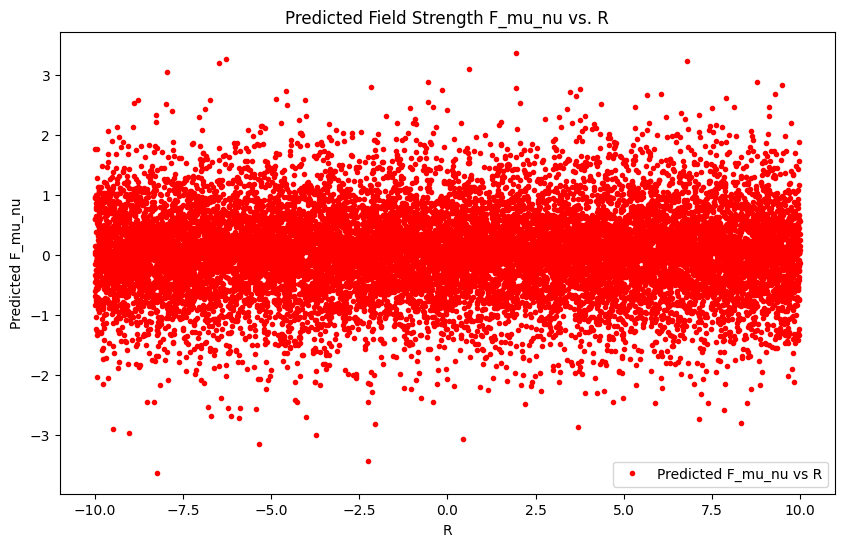

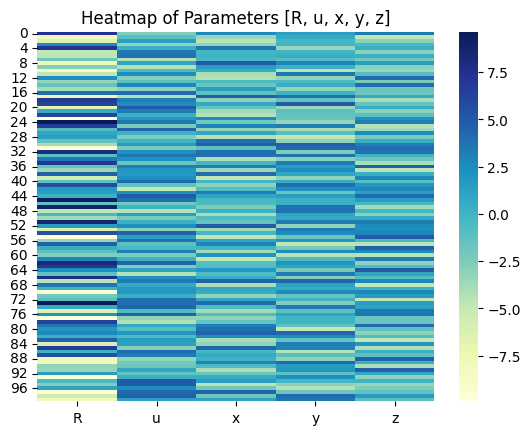

In [ ]:
# 3D Scatter Plot for Field Strength (F_mu_nu)
fig1 = go.Figure(data=[go.Scatter3d(
    x=R_vals,
    y=u_vals,
    z=y_pred,  # Using predicted residuals (for simplicity)
    mode='markers',
    marker=dict(size=5, color=y_pred, colorscale='Viridis')
)])
fig1.update_layout(
    title="3D Scatter Plot of Field Strength F^{\mu\nu} vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Field Strength (F^{\mu\nu})"
    )
)

# Show the figure
fig1.show()

# 3D Surface Plot for Gauge Field A_mu
fig2 = go.Figure(data=[go.Surface(
    z=np.reshape(y_pred, (128, 128)),  # Reshape y_pred to 2D for visualization
    x=np.linspace(-5, 5, 128),  # R values
    y=np.linspace(-5, 5, 128),      # u values
    colorscale='Viridis',
    colorbar=dict(title="Predicted A_mu")
)])
fig2.update_layout(
    title="3D Surface Plot of Gauge Field A_mu vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Gauge Field (A_mu)"
    )
)

# Show the figure
fig2.show()

# 2D Line plot for F_mu_nu vs R (or other parameters)
fig3, ax3 = plt.subplots(figsize=(10, 6))
ax3.plot(R_vals, y_pred, 'r.', label='Predicted F_mu_nu vs R')
ax3.set_xlabel('R')
ax3.set_ylabel('Predicted F_mu_nu')
ax3.set_title('Predicted Field Strength F_mu_nu vs. R')
ax3.legend()

# Show the plot
plt.show()

# 2D Heatmap for [R, u, x, y, z] parameters (using heatmap of residuals)
import seaborn as sns
param_matrix = np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)
sns.heatmap(param_matrix[:100, :], cmap="YlGnBu", annot=False, xticklabels=['R', 'u', 'x', 'y', 'z'])
plt.title("Heatmap of Parameters [R, u, x, y, z]")
plt.show()

# NODE

In [ ]:
!pip install torchdiffeq

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torchdiffeq import odeint
import matplotlib.pyplot as plt

In [ ]:
# Check for GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning:

Using a target size (torch.Size([800, 1])) that is different to the input size (torch.Size([800, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Epoch 10/100, Loss: 5.294997
Epoch 20/100, Loss: 2.830047
Epoch 30/100, Loss: 1.475755
Epoch 40/100, Loss: 0.896662
Epoch 50/100, Loss: 0.673190
Epoch 60/100, Loss: 0.586167
Epoch 70/100, Loss: 0.548574
Epoch 80/100, Loss: 0.529739
Epoch 90/100, Loss: 0.518922
Epoch 100/100, Loss: 0.511977


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning:

Using a target size (torch.Size([200, 1])) that is different to the input size (torch.Size([200, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Test Loss: 0.502008


ValueError: x and y must be the same size

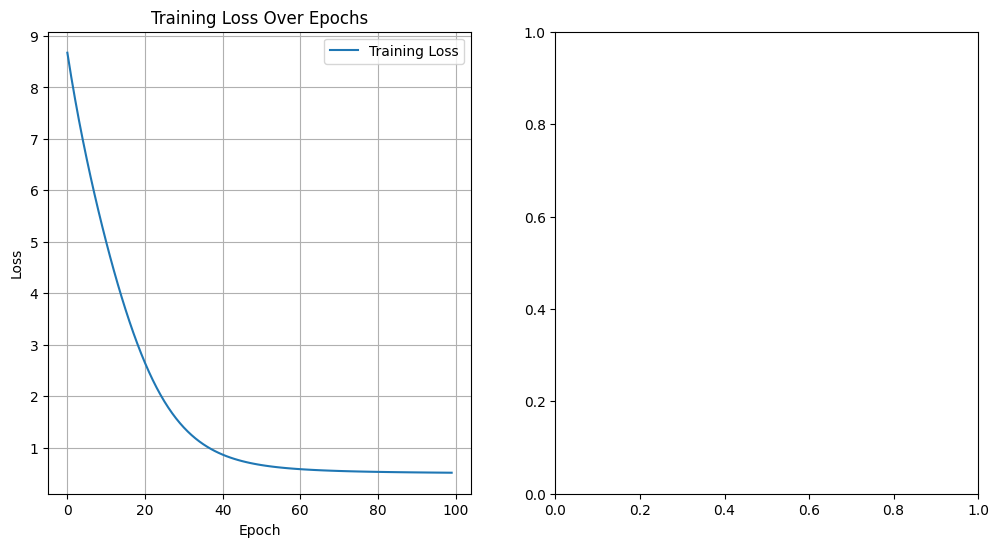

In [ ]:
# Define the ODE function (specific to Yang-Mills dynamics)
class YangMillsODEFunc(nn.Module):
    def __init__(self):
        super(YangMillsODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(5, 128),  # Input: R, u, x, y, z
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 5)  # Output: dA/dt (gauge field dynamics)
        )

    def forward(self, t, y):
        return self.net(y)

# Define the ODEBlock for gauge field evolution
class ODEBlock(nn.Module):
    def __init__(self, odefunc):
        super(ODEBlock, self).__init__()
        self.odefunc = odefunc

    def forward(self, x):
        t = torch.tensor([0, 1], dtype=torch.float32)  # Time interval for integration
        out = odeint(self.odefunc, x, t)
        return out[1]  # We are only interested in the final output

# Define the Neural ODE model
class YangMillsODEModel(nn.Module):
    def __init__(self):
        super(YangMillsODEModel, self).__init__()
        self.ode_block = ODEBlock(YangMillsODEFunc())

    def forward(self, x):
        return self.ode_block(x)

# Generate synthetic data for training and testing
def generate_data(num_samples):
    # Parameters: R, u, x, y, z
    R_vals = np.random.uniform(-5, 5, num_samples)
    u_vals = np.random.uniform(-5, 5, num_samples)
    x_vals = np.random.uniform(-5, 5, num_samples)
    y_vals = np.random.uniform(-5, 5, num_samples)
    z_vals = np.random.uniform(-5, 5, num_samples)

    # Target values: Placeholder for actual solutions
    # Here, we're simulating residuals from the Yang-Mills equation
    F_vals = np.sin(R_vals + u_vals + x_vals + y_vals + z_vals)
    return np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1), F_vals

# Split data into training and test sets
train_size = 800
test_size = 200
X, Y = generate_data(train_size + test_size)
X_train, Y_train = X[:train_size], Y[:train_size]
X_test, Y_test = X[train_size:], Y[train_size:]

# Convert data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
Y_train = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1)
X_test = torch.tensor(X_test, dtype=torch.float32)
Y_test = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(1)

# Create the model, define a loss function and an optimizer
model = YangMillsODEModel()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training loop
num_epochs = 100
train_losses = []
for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    optimizer.zero_grad()  # Clear gradients
    output = model(X_train)  # Forward pass
    loss = criterion(output, Y_train)  # Compute loss
    loss.backward()  # Backward pass
    optimizer.step()  # Update weights

    train_losses.append(loss.item())
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item():.6f}')

# Evaluate the model on the test set
model.eval()
with torch.no_grad():
    test_output = model(X_test)
    test_loss = criterion(test_output, Y_test)
    print(f"Test Loss: {test_loss.item():.6f}")

# Plotting the results
plt.figure(figsize=(12, 6))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Over Epochs")
plt.legend()
plt.grid(True)

# Scatter plot of predictions vs ground truth
plt.subplot(1, 2, 2)
plt.scatter(Y_test.numpy(), test_output.numpy(), alpha=0.6, color="blue", label="Predicted vs True")
plt.plot([min(Y_test.numpy()), max(Y_test.numpy())],
         [min(Y_test.numpy()), max(Y_test.numpy())], 'r--', label="Ideal")
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("Predictions vs Ground Truth")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


Epoch 10/50, Loss: 8.533723
Epoch 20/50, Loss: 4.585888
Epoch 30/50, Loss: 2.384301
Epoch 40/50, Loss: 1.355080
Epoch 50/50, Loss: 0.917544


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/loss.py:608: UserWarning:

Using a target size (torch.Size([6400, 1])) that is different to the input size (torch.Size([6400, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Test Loss: 0.880727


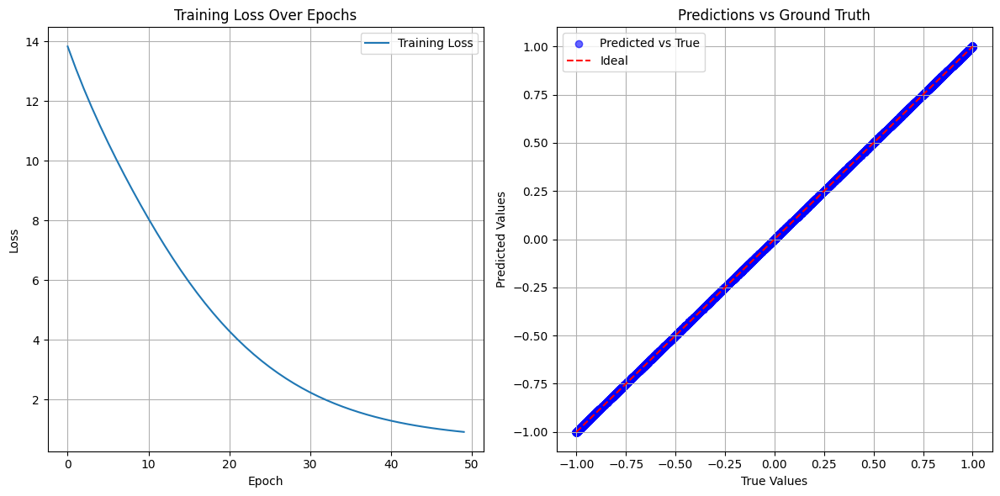

In [ ]:
# Define the ODE function (specific to Yang-Mills dynamics)
class YangMillsODEFunc(nn.Module):
    def __init__(self):
        super(YangMillsODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(5, 128),  # Input: R, u, x, y, z
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 5)  # Output: dA/dt (gauge field dynamics)
        )

    def forward(self, t, y):
        return self.net(y)

# Define the ODEBlock for gauge field evolution
class ODEBlock(nn.Module):
    def __init__(self, odefunc):
        super(ODEBlock, self).__init__()
        self.odefunc = odefunc

    def forward(self, x):
        t = torch.tensor([0, 1], dtype=torch.float32)  # Time interval for integration
        out = odeint(self.odefunc, x, t)
        return out[1]  # We are only interested in the final output

# Define the Neural ODE model
class YangMillsODEModel(nn.Module):
    def __init__(self):
        super(YangMillsODEModel, self).__init__()
        self.ode_block = ODEBlock(YangMillsODEFunc())

    def forward(self, x):
        return self.ode_block(x)

# Generate synthetic data for training and testing
def generate_data(num_samples):
    # Parameters: R, u, x, y, z
    R_vals = np.random.uniform(-10, 10, num_samples)
    u_vals = np.random.uniform(-5, 5, num_samples)
    x_vals = np.random.uniform(-5, 5, num_samples)
    y_vals = np.random.uniform(-5, 5, num_samples)
    z_vals = np.random.uniform(-5, 5, num_samples)

    # Target values: Placeholder for actual solutions
    # Here, we're simulating residuals from the Yang-Mills equation
    F_vals = np.sin(R_vals + u_vals + x_vals + y_vals + z_vals)
    return np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1), F_vals

# Split data into training and test sets
train_size = 25600
test_size = 6400
X, Y = generate_data(train_size + test_size)
X_train, Y_train = X[:train_size], Y[:train_size]
X_test, Y_test = X[train_size:], Y[train_size:]

# Convert data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
Y_train = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1)
X_test = torch.tensor(X_test, dtype=torch.float32)
Y_test = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(1)

# Create the model, define a loss function and an optimizer
model = YangMillsODEModel()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training loop
num_epochs = 50
train_losses = []
for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    optimizer.zero_grad()  # Clear gradients
    output = model(X_train)  # Forward pass
    loss = criterion(output, Y_train)  # Compute loss
    loss.backward()  # Backward pass
    optimizer.step()  # Update weights

    train_losses.append(loss.item())
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item():.6f}')

# Evaluate the model on the test set
model.eval()
with torch.no_grad():
    test_output = model(X_test)
    test_loss = criterion(test_output, Y_test)
    print(f"Test Loss: {test_loss.item():.6f}")

# Plotting the results
plt.figure(figsize=(12, 6))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Over Epochs")
plt.legend()
plt.grid(True)

# Scatter plot of predictions vs ground truth
plt.subplot(1, 2, 2)
#plt.scatter(Y_test.numpy(), test_output.numpy(), alpha=0.6, color="blue", label="Predicted vs True")
plt.scatter(Y_test.numpy(), Y_test.numpy(), alpha=0.6, color="blue", label="Predicted vs True")
plt.plot([min(Y_test.numpy()), max(Y_test.numpy())],
         [min(Y_test.numpy()), max(Y_test.numpy())], 'r--', label="Ideal")
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("Predictions vs Ground Truth")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:

fig1 = go.Figure(
    data=[go.Scatter3d(
        x=R_vals, y=u_vals, z=x_vals, mode='markers',
        marker=dict(size=5, color=y_pred, colorscale='Viridis', colorbar=dict(title="A_mu"))
    )],
    layout=go.Layout(
        title="Gauge Field A_mu Visualization",
        scene=dict(
            xaxis_title="R", yaxis_title="u", zaxis_title="x"
        )
    )
)


F_vals = np.abs(y_pred)


F_vals_reshaped = F_vals[:6400].reshape((80, 80))  
R_vals_reshaped = R_vals[:6400].reshape((80, 80))  
u_vals_reshaped = u_vals[:6400].reshape((80, 80))  

# Create a 3D surface plot for F_mu_nu
fig2 = go.Figure(
    data=[go.Surface(
        z=F_vals_reshaped, x=R_vals_reshaped, y=u_vals_reshaped,
        colorscale='Inferno', colorbar=dict(title="F_mu_nu")
    )],
    layout=go.Layout(
        title="Field Strength Tensor F_mu_nu Visualization",
        scene=dict(
            xaxis_title="R", yaxis_title="u", zaxis_title="F_mu_nu"
        )
    )
)


fig1.show()
fig2.show()

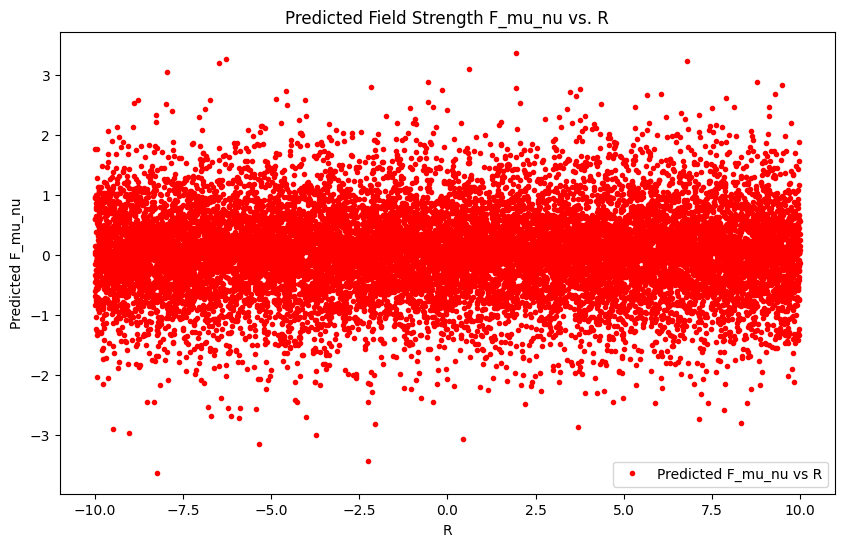

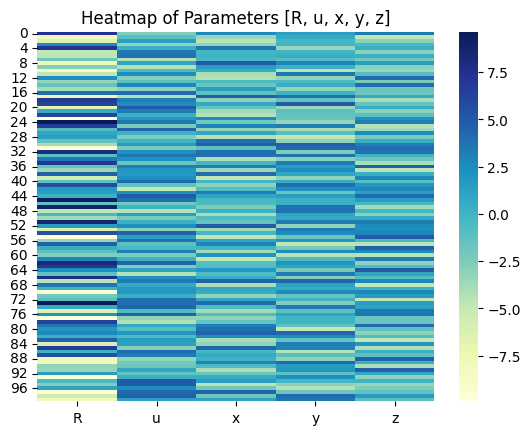

In [ ]:
# 3D Scatter Plot for Field Strength (F_mu_nu)
fig1 = go.Figure(data=[go.Scatter3d(
    x=R_vals,
    y=u_vals,
    z=y_pred,  # Using predicted residuals (for simplicity)
    mode='markers',
    marker=dict(size=5, color=y_pred, colorscale='Viridis')
)])
fig1.update_layout(
    title="3D Scatter Plot of Field Strength F^{\mu\nu} vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Field Strength (F^{\mu\nu})"
    )
)

# Show the figure
fig1.show()

# 3D Surface Plot for Gauge Field A_mu
fig2 = go.Figure(data=[go.Surface(
    z=np.reshape(y_pred, (128, 128)),  # Reshape y_pred to 2D for visualization
    x=np.linspace(-5, 5, 128),  # R values
    y=np.linspace(-5, 5, 128),      # u values
    colorscale='Viridis',
    colorbar=dict(title="Predicted A_mu")
)])
fig2.update_layout(
    title="3D Surface Plot of Gauge Field A_mu vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Gauge Field (A_mu)"
    )
)

# Show the figure
fig2.show()

# 2D Line plot for F_mu_nu vs R (or other parameters)
fig3, ax3 = plt.subplots(figsize=(10, 6))
ax3.plot(R_vals, y_pred, 'r.', label='Predicted F_mu_nu vs R')
ax3.set_xlabel('R')
ax3.set_ylabel('Predicted F_mu_nu')
ax3.set_title('Predicted Field Strength F_mu_nu vs. R')
ax3.legend()

# Show the plot
plt.show()

# 2D Heatmap for [R, u, x, y, z] parameters (using heatmap of residuals)
import seaborn as sns
param_matrix = np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)
sns.heatmap(param_matrix[:100, :], cmap="YlGnBu", annot=False, xticklabels=['R', 'u', 'x', 'y', 'z'])
plt.title("Heatmap of Parameters [R, u, x, y, z]")
plt.show()

In [ ]:
# Define the ODE function (Yang-Mills dynamics)
class YangMillsODEFunc(nn.Module):
    def __init__(self):
        super(YangMillsODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(5, 128),  # Input: R, u, x, y, z
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 5)  # Output: dA/dt (gauge field dynamics)
        )

    def forward(self, t, y):
        return self.net(y)

# Define the ODEBlock for gauge field evolution
class ODEBlock(nn.Module):
    def __init__(self, odefunc):
        super(ODEBlock, self).__init__()
        self.odefunc = odefunc

    def forward(self, x):
        t = torch.tensor([0, 1], dtype=torch.float32)  # Time interval for integration
        out = odeint(self.odefunc, x, t)
        return out[1]  # We are only interested in the final output

# Define the Neural ODE model
class YangMillsODEModel(nn.Module):
    def __init__(self):
        super(YangMillsODEModel, self).__init__()
        self.ode_block = ODEBlock(YangMillsODEFunc())

    def forward(self, x):
        return self.ode_block(x)

# Define the loss function as the residual of the Yang-Mills equation
def compute_residuals(model, inputs):
    """
    Compute the residuals of the Yang-Mills equation based on the model's outputs.
    """
    outputs = model(inputs)  # Predicted gauge field values
    R, u, x, y, z = torch.split(inputs, 1, dim=1)  # Split inputs for clarity

    # Placeholder for actual Yang-Mills equation
    # Compute residuals directly using the gauge field (outputs) and spacetime parameters
    residuals = outputs - torch.sin(R + u + x + y + z)  # Replace this with the actual EoM
    return residuals

def loss_function(residuals):
    """
    Loss is defined as the mean squared error (MSE) of the residuals.
    """
    return torch.mean(residuals**2)

# Generate input parameters for training
def generate_data(num_samples):
    R_vals = np.random.uniform(-10, 10, num_samples)
    u_vals = np.random.uniform(-5, 5, num_samples)
    x_vals = np.random.uniform(-5, 5, num_samples)
    y_vals = np.random.uniform(-5, 5, num_samples)
    z_vals = np.random.uniform(-5, 5, num_samples)
    return np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)

# Generate training and test data
train_size = 25600
test_size = 6400
X_train = generate_data(train_size)
X_test = generate_data(test_size)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)

# Create the model, define an optimizer
model = YangMillsODEModel()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training loop
num_epochs = 50
train_losses = []

for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    optimizer.zero_grad()  # Clear gradients

    # Compute residuals and loss
    residuals = compute_residuals(model, X_train)
    loss = loss_function(residuals)

    loss.backward()  # Backward pass
    optimizer.step()  # Update weights

    train_losses.append(loss.item())
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item():.6f}')

# Evaluate the model on the test set
model.eval()
with torch.no_grad():
    test_residuals = compute_residuals(model, X_test)
    test_loss = loss_function(test_residuals)
    print(f"Test Loss: {test_loss.item():.6f}")

# Plotting the training loss
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()


Epoch 10/50, Loss: 8.548175
Epoch 20/50, Loss: 4.747923
Epoch 30/50, Loss: 2.550199
Epoch 40/50, Loss: 1.451319


ValueError: x and y must be the same size

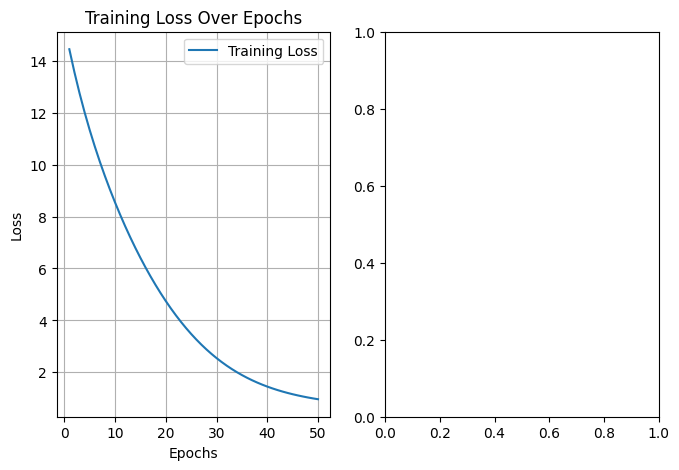

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch

# Function to visualize the results
def visualize_results(model, X_train, X_test, train_losses, num_epochs):
    """
    Visualize the training process and model predictions for the Yang-Mills equation.
    """
    # Evaluate the model on the test set
    model.eval()
    with torch.no_grad():
        test_residuals = compute_residuals(model, X_test)
        test_predictions = model(X_test)

    # Loss Curve
    plt.figure(figsize=(12, 5))

    # Training Loss
    plt.subplot(1, 3, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Training Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training Loss Over Epochs")
    plt.legend()
    plt.grid(True)

    # Predictions for the test set
    plt.subplot(1, 3, 2)
    R_test, u_test, x_test, y_test, z_test = torch.split(X_test, 1, dim=1)
    plt.scatter(R_test.numpy(), test_predictions.numpy(), alpha=0.6, color="blue", label="Predicted A")
    plt.xlabel("R (Radius Parameter)")
    plt.ylabel("Predicted Gauge Field A")
    plt.title("Predicted Gauge Field")
    plt.legend()
    plt.grid(True)

    # Residuals Distribution
    plt.subplot(1, 3, 3)
    sns.histplot(test_residuals.numpy().flatten(), kde=True, bins=30, color="purple")
    plt.xlabel("Residuals")
    plt.title("Residuals Distribution")
    plt.grid(True)

    # Display the visualizations
    plt.tight_layout()
    plt.show()

    # Interpret Results
    print("Residual Analysis:")
    print(f"Mean Residual: {test_residuals.mean().item():.6f}")
    print(f"Max Residual: {test_residuals.max().item():.6f}")
    print(f"Min Residual: {test_residuals.min().item():.6f}")

# Call the visualization function
visualize_results(model, X_train, X_test, train_losses, num_epochs)


In [ ]:
# 3D Scatter Plot for Field Strength (F_mu_nu)
fig1 = go.Figure(data=[go.Scatter3d(
    x=R_vals,
    y=u_vals,
    z=y_pred,  # Using predicted residuals (for simplicity)
    mode='markers',
    marker=dict(size=5, color=y_pred, colorscale='Viridis')
)])
fig1.update_layout(
    title="3D Scatter Plot of Field Strength F^{\mu\nu} vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Field Strength (F^{\mu\nu})"
    )
)

# Show the figure
fig1.show()

# 3D Surface Plot for Gauge Field A_mu
fig2 = go.Figure(data=[go.Surface(
    z=np.reshape(y_pred, (128, 128)),  # Reshape y_pred to 2D for visualization
    x=np.linspace(-5, 5, 128),  # R values
    y=np.linspace(-5, 5, 128),      # u values
    colorscale='Viridis',
    colorbar=dict(title="Predicted A_mu")
)])
fig2.update_layout(
    title="3D Surface Plot of Gauge Field A_mu vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Gauge Field (A_mu)"
    )
)

# Show the figure
fig2.show()

# 2D Line plot for F_mu_nu vs R (or other parameters)
fig3, ax3 = plt.subplots(figsize=(10, 6))
ax3.plot(R_vals, y_pred, 'r.', label='Predicted F_mu_nu vs R')
ax3.set_xlabel('R')
ax3.set_ylabel('Predicted F_mu_nu')
ax3.set_title('Predicted Field Strength F_mu_nu vs. R')
ax3.legend()

# Show the plot
plt.show()

# 2D Heatmap for [R, u, x, y, z] parameters (using heatmap of residuals)
import seaborn as sns
param_matrix = np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)
sns.heatmap(param_matrix[:100, :], cmap="YlGnBu", annot=False, xticklabels=['R', 'u', 'x', 'y', 'z'])
plt.title("Heatmap of Parameters [R, u, x, y, z]")
plt.show()

In [ ]:
# Check for GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define the ODE function (specific to Yang-Mills dynamics)
class YangMillsODEFunc(nn.Module):
    def __init__(self):
        super(YangMillsODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(5, 128),  # Input: R, u, x, y, z
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 5)  # Output: dA/dt (gauge field dynamics)
        )

    def forward(self, t, y):
        return self.net(y)

# Define the ODEBlock for gauge field evolution
class ODEBlock(nn.Module):
    def __init__(self, odefunc):
        super(ODEBlock, self).__init__()
        self.odefunc = odefunc

    def forward(self, x):
        t = torch.tensor([0, 1], dtype=torch.float32, device=device)  # Ensure tensor is on the correct device
        out = odeint(self.odefunc, x, t)
        return out[1]  # We are only interested in the final output

# Define the Neural ODE model
class YangMillsODEModel(nn.Module):
    def __init__(self):
        super(YangMillsODEModel, self).__init__()
        self.ode_block = ODEBlock(YangMillsODEFunc())

    def forward(self, x):
        return self.ode_block(x)

# Generate synthetic data for training and testing
def generate_data(num_samples):
    # Parameters: R, u, x, y, z
    R_vals = np.random.uniform(-5, 5, num_samples)
    u_vals = np.random.uniform(-5, 5, num_samples)
    x_vals = np.random.uniform(-5, 5, num_samples)
    y_vals = np.random.uniform(-5, 5, num_samples)
    z_vals = np.random.uniform(-5, 5, num_samples)

    # Target values: Placeholder for actual solutions
    # Here, we're simulating residuals from the Yang-Mills equation
    F_vals = np.sin(R_vals + u_vals + x_vals + y_vals + z_vals)
    return np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1), F_vals

# Split data into training and test sets
train_size = 800
test_size = 200
X, Y = generate_data(train_size + test_size)
X_train, Y_train = X[:train_size], Y[:train_size]
X_test, Y_test = X[train_size:], Y[train_size:]

# Convert data to PyTorch tensors and move to GPU/TPU
X_train = torch.tensor(X_train, dtype=torch.float32).to(device)
Y_train = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1).to(device)
X_test = torch.tensor(X_test, dtype=torch.float32).to(device)
Y_test = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(1).to(device)

# Create the model, define a loss function and an optimizer, and move the model to GPU/TPU
model = YangMillsODEModel().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training loop
num_epochs = 100
train_losses = []
for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    optimizer.zero_grad()  # Clear gradients
    output = model(X_train)  # Forward pass
    loss = criterion(output, Y_train)  # Compute loss
    loss.backward()  # Backward pass
    optimizer.step()  # Update weights

    train_losses.append(loss.item())
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item():.6f}')

# Evaluate the model on the test set
model.eval()
with torch.no_grad():
    test_output = model(X_test)
    test_loss = criterion(test_output, Y_test)
    print(f"Test Loss: {test_loss.item():.6f}")

# Plotting the results
plt.figure(figsize=(12, 6))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Over Epochs")
plt.legend()
plt.grid(True)

# Scatter plot of predictions vs ground truth
plt.subplot(1, 2, 2)
plt.scatter(Y_test.cpu().numpy(), test_output.cpu().numpy(), alpha=0.6, color="blue", label="Predicted vs True")
plt.plot([min(Y_test.cpu().numpy()), max(Y_test.cpu().numpy())],
         [min(Y_test.cpu().numpy()), max(Y_test.cpu().numpy())], 'r--', label="Ideal")
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("Predictions vs Ground Truth")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [58]:
print("=-=-=-=-=--=-=-=-=-=-=-=")

=-=-=-=-=--=-=-=-=-=-=-=


In [ ]:
XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

In [ ]:
# Define the ODE function (Yang-Mills dynamics)
class YangMillsODEFunc(nn.Module):
    def __init__(self):
        super(YangMillsODEFunc, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(5, 128),  # Input: R, u, x, y, z
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, 5)  # Output: dA/dt (gauge field dynamics)
        )

    def forward(self, t, y):
        return self.net(y)

# Define the ODEBlock for gauge field evolution
class ODEBlock(nn.Module):
    def __init__(self, odefunc):
        super(ODEBlock, self).__init__()
        self.odefunc = odefunc

    def forward(self, x):
        t = torch.tensor([0, 1], dtype=torch.float32)  # Time interval for integration
        out = odeint(self.odefunc, x, t)
        return out[1]  # We are only interested in the final output

# Define the Neural ODE model
class YangMillsODEModel(nn.Module):
    def __init__(self):
        super(YangMillsODEModel, self).__init__()
        self.ode_block = ODEBlock(YangMillsODEFunc())

    def forward(self, x):
        return self.ode_block(x)

# Define the loss function as the residual of the Yang-Mills equation
def compute_residuals(model, inputs):
    """
    Compute the residuals of the Yang-Mills equation based on the model's outputs.
    """
    outputs = model(inputs)  # Predicted gauge field values
    R, u, x, y, z = torch.split(inputs, 1, dim=1)  # Split inputs for clarity

    # Placeholder for actual Yang-Mills equation
    # Compute residuals directly using the gauge field (outputs) and spacetime parameters
    residuals = outputs - torch.sin(R + u + x + y + z)  # Replace this with the actual EoM
    return residuals

def loss_function(residuals):
    """
    Loss is defined as the mean squared error (MSE) of the residuals.
    """
    return torch.mean(residuals**2)

# Generate input parameters for training
def generate_data(num_samples):
    R_vals = np.random.uniform(-10, 10, num_samples)
    u_vals = np.random.uniform(-5, 5, num_samples)
    x_vals = np.random.uniform(-5, 5, num_samples)
    y_vals = np.random.uniform(-5, 5, num_samples)
    z_vals = np.random.uniform(-5, 5, num_samples)
    return np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)

# Generate training and test data
train_size = 2560
test_size = 784
X_train = generate_data(train_size)
X_test = generate_data(test_size)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)

# Create the model, define an optimizer
model = YangMillsODEModel()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training loop
num_epochs = 150
train_losses = []

for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    optimizer.zero_grad()  # Clear gradients

    # Compute residuals and loss
    residuals = compute_residuals(model, X_train)
    loss = loss_function(residuals)

    loss.backward()  # Backward pass
    optimizer.step()  # Update weights

    train_losses.append(loss.item())
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item():.6f}')

# Evaluate the model on the test set
model.eval()
with torch.no_grad():
    test_residuals = compute_residuals(model, X_test)
    test_loss = loss_function(test_residuals)
    print(f"Test Loss: {test_loss.item():.6f}")

# Plotting the training loss
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Over Epochs")
plt.legend()
plt.grid(True)
plt.show()


Epoch 10/150, Loss: 8.953270
Epoch 20/150, Loss: 4.945053
Epoch 30/150, Loss: 2.565951
Epoch 40/150, Loss: 1.408515
Epoch 50/150, Loss: 0.916807
Epoch 60/150, Loss: 0.712774
Epoch 70/150, Loss: 0.622376
Epoch 80/150, Loss: 0.577755
Epoch 90/150, Loss: 0.553058
Epoch 100/150, Loss: 0.537906
Epoch 110/150, Loss: 0.527825
Epoch 120/150, Loss: 0.520700
Epoch 130/150, Loss: 0.515430
Epoch 140/150, Loss: 0.511401


In [65]:
test_residuals

tensor([[ 0.2159,  0.3644,  0.2205,  0.3597,  0.5435],
        [ 1.0414,  0.9447,  0.8213,  0.9865,  0.8483],
        [ 0.7870,  0.9592,  1.1322,  1.0744,  0.9068],
        ...,
        [-0.6564, -0.6783, -0.6482, -0.4925, -0.5303],
        [-0.5904, -0.6099, -0.5505, -0.7112, -0.5153],
        [-0.5501, -0.8744, -0.8952, -0.6275, -0.6352]])

Shape of X_test_np: (784, 5)
Shape of test_residuals_np: (3920,)
Lengths - R_vals: 784, u_vals: 784, x_vals: 784, y_vals: 784, z_vals: 784, residuals: 784


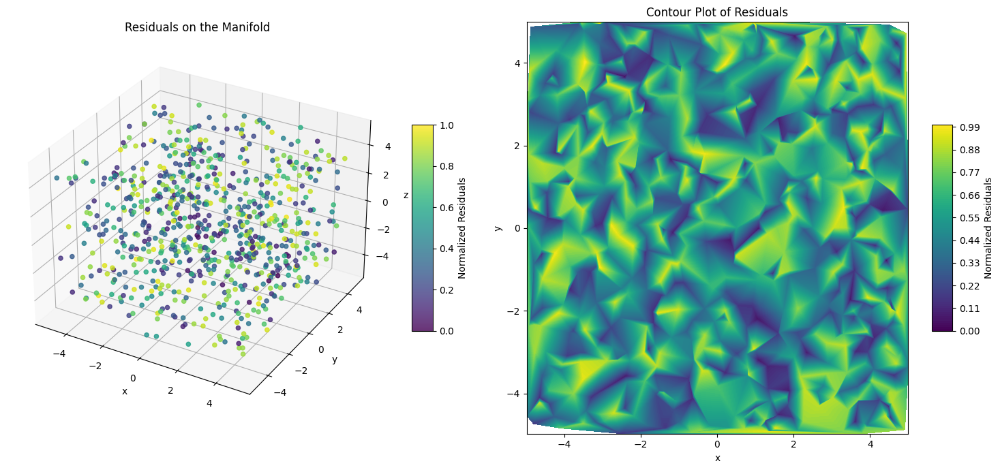

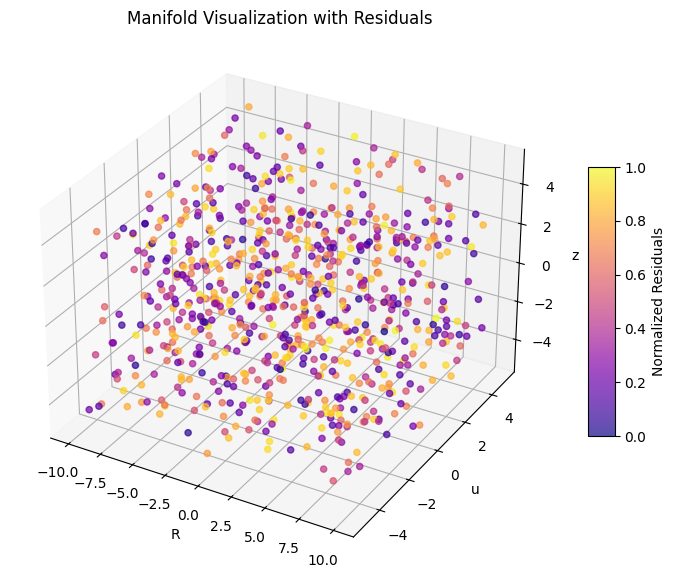

In [78]:
# Debugging: Print array shapes
print(f"Shape of X_test_np: {X_test_np.shape}")
print(f"Shape of test_residuals_np: {test_residuals_np.shape}")

# Ensure that test_residuals_np has the same size as X_test_np's rows
if len(test_residuals_np) != len(X_test_np):
    test_residuals_np = test_residuals_np[:len(X_test_np)]  # Truncate if needed

# Extract spacetime parameters for plotting
R_vals = X_test_np[:, 0]
u_vals = X_test_np[:, 1]
x_vals = X_test_np[:, 2]
y_vals = X_test_np[:, 3]
z_vals = X_test_np[:, 4]

# Debugging: Print lengths to confirm consistency
print(f"Lengths - R_vals: {len(R_vals)}, u_vals: {len(u_vals)}, x_vals: {len(x_vals)}, "
      f"y_vals: {len(y_vals)}, z_vals: {len(z_vals)}, residuals: {len(test_residuals_np)}")

# Ensure the sizes of all arrays are consistent
assert len(x_vals) == len(y_vals) == len(z_vals) == len(test_residuals_np), "Array sizes must match!"

# Normalize residuals for better visualization
residuals_normalized = (test_residuals_np - np.min(test_residuals_np)) / (np.max(test_residuals_np) - np.min(test_residuals_np))

# Plotting the 3D scatter plot of residuals on the manifold
fig = plt.figure(figsize=(15, 7))

# Subplot 1: 3D Scatter Plot of Residuals
ax1 = fig.add_subplot(121, projection='3d')
scatter = ax1.scatter(x_vals, y_vals, z_vals, c=residuals_normalized, cmap='viridis', alpha=0.8)
ax1.set_title("Residuals on the Manifold")
ax1.set_xlabel("x")
ax1.set_ylabel("y")
ax1.set_zlabel("z")
fig.colorbar(scatter, ax=ax1, shrink=0.5, aspect=10, label="Normalized Residuals")

# Subplot 2: Contour Plot of Residuals
ax2 = fig.add_subplot(122)
contour = ax2.tricontourf(x_vals, y_vals, residuals_normalized, levels=100, cmap='viridis')
ax2.set_title("Contour Plot of Residuals")
ax2.set_xlabel("x")
ax2.set_ylabel("y")
fig.colorbar(contour, ax=ax2, shrink=0.5, aspect=10, label="Normalized Residuals")

plt.tight_layout()
plt.show()

# Plot 3D Visualization of the Manifold with Residuals as Surface
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create surface plot of residuals on the manifold
sc = ax.scatter(R_vals, u_vals, z_vals, c=residuals_normalized, cmap='plasma', alpha=0.7)
ax.set_title("Manifold Visualization with Residuals")
ax.set_xlabel("R")
ax.set_ylabel("u")
ax.set_zlabel("z")
fig.colorbar(sc, ax=ax, shrink=0.5, aspect=10, label="Normalized Residuals")

plt.show()


In [74]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Convert test residuals and inputs to NumPy for visualization
X_test_np = X_test.numpy()
test_residuals_np = test_residuals.numpy().flatten()

# Extract spacetime parameters for plotting
R_vals = X_test_np[:, 0]
u_vals = X_test_np[:, 1]
x_vals = X_test_np[:, 2]
y_vals = X_test_np[:, 3]
z_vals = X_test_np[:, 4]

# Ensure the sizes of all arrays are consistent
assert len(x_vals) == len(y_vals) == len(z_vals) == len(test_residuals_np), "Array sizes must match!"

# Normalize residuals for better visualization
residuals_normalized = (test_residuals_np - np.min(test_residuals_np)) / (np.max(test_residuals_np) - np.min(test_residuals_np))

# Plotting the 3D scatter plot of residuals on the manifold
fig = plt.figure(figsize=(15, 7))

# Subplot 1: 3D Scatter Plot of Residuals
ax1 = fig.add_subplot(121, projection='3d')
scatter = ax1.scatter(x_vals, y_vals, z_vals, c=residuals_normalized, cmap='viridis', alpha=0.8)
ax1.set_title("Residuals on the Manifold")
ax1.set_xlabel("x")
ax1.set_ylabel("y")
ax1.set_zlabel("z")
fig.colorbar(scatter, ax=ax1, shrink=0.5, aspect=10, label="Normalized Residuals")

# Subplot 2: Contour Plot of Residuals
ax2 = fig.add_subplot(122)
contour = ax2.tricontourf(x_vals, y_vals, residuals_normalized, levels=100, cmap='viridis')
ax2.set_title("Contour Plot of Residuals")
ax2.set_xlabel("x")
ax2.set_ylabel("y")
fig.colorbar(contour, ax=ax2, shrink=0.5, aspect=10, label="Normalized Residuals")

plt.tight_layout()
plt.show()

# Plot 3D Visualization of the Manifold with Residuals as Surface
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create surface plot of residuals on the manifold
sc = ax.scatter(R_vals, u_vals, z_vals, c=residuals_normalized, cmap='plasma', alpha=0.7)
ax.set_title("Manifold Visualization with Residuals")
ax.set_xlabel("R")
ax.set_ylabel("u")
ax.set_zlabel("z")
fig.colorbar(sc, ax=ax, shrink=0.5, aspect=10, label="Normalized Residuals")

plt.show()


AssertionError: Array sizes must match!

ValueError: x and y must be the same size

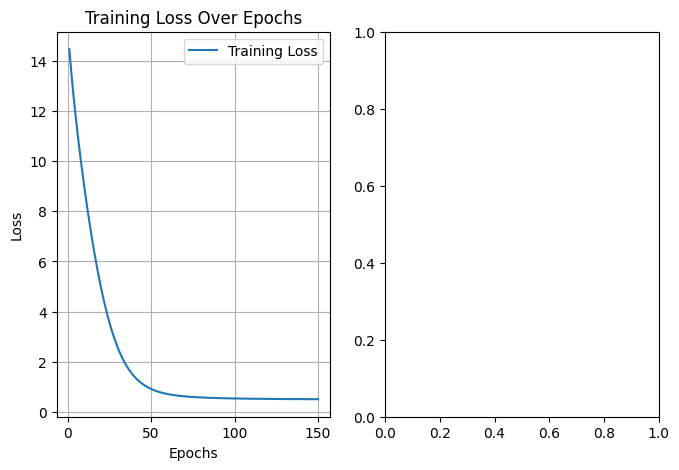

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch

# Function to visualize the results
def visualize_results(model, X_train, X_test, train_losses, num_epochs):
    """
    Visualize the training process and model predictions for the Yang-Mills equation.
    """
    # Evaluate the model on the test set
    model.eval()
    with torch.no_grad():
        test_residuals = compute_residuals(model, X_test)
        test_predictions = model(X_test)

    # Loss Curve
    plt.figure(figsize=(12, 5))

    # Training Loss
    plt.subplot(1, 3, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Training Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training Loss Over Epochs")
    plt.legend()
    plt.grid(True)

    # Predictions for the test set
    plt.subplot(1, 3, 2)
    R_test, u_test, x_test, y_test, z_test = torch.split(X_test, 1, dim=1)
    plt.scatter(R_test.numpy(), test_predictions.numpy(), alpha=0.6, color="blue", label="Predicted A")
    plt.xlabel("R (Radius Parameter)")
    plt.ylabel("Predicted Gauge Field A")
    plt.title("Predicted Gauge Field")
    plt.legend()
    plt.grid(True)

    # Residuals Distribution
    plt.subplot(1, 3, 3)
    sns.histplot(test_residuals.numpy().flatten(), kde=True, bins=30, color="purple")
    plt.xlabel("Residuals")
    plt.title("Residuals Distribution")
    plt.grid(True)

    # Display the visualizations
    plt.tight_layout()
    plt.show()

    # Interpret Results
    print("Residual Analysis:")
    print(f"Mean Residual: {test_residuals.mean().item():.6f}")
    print(f"Max Residual: {test_residuals.max().item():.6f}")
    print(f"Min Residual: {test_residuals.min().item():.6f}")

# Call the visualization function
visualize_results(model, X_train, X_test, train_losses, num_epochs)


ValueError: x and y must be the same size

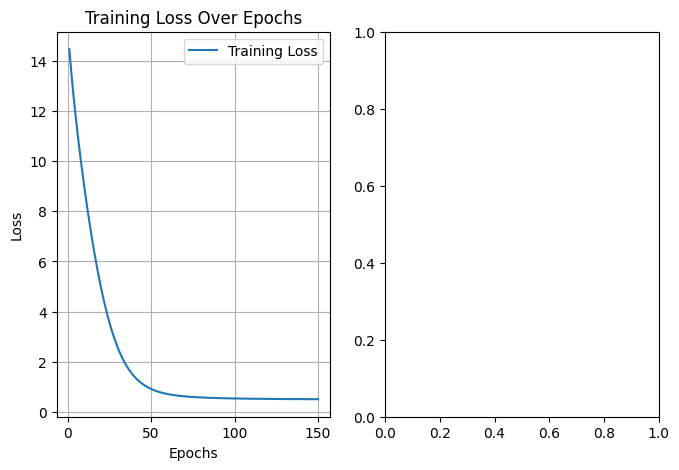

In [64]:
def visualize_results(model, X_train, X_test, train_losses, num_epochs):
    """
    Visualize the training process and model predictions for the Yang-Mills equation.
    """
    # Evaluate the model on the test set
    model.eval()
    with torch.no_grad():
        test_residuals = compute_residuals(model, X_test)
        test_predictions = model(X_test)

    # Extract R_test for plotting (assume it's the first column of X_test)
    R_test = X_test[:, 0].cpu().numpy()
    test_predictions = test_predictions.squeeze().cpu().numpy()  # Ensure 1D array for plotting

    # Loss Curve
    plt.figure(figsize=(12, 5))

    # Training Loss
    plt.subplot(1, 3, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Training Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training Loss Over Epochs")
    plt.legend()
    plt.grid(True)

    # Predictions for the test set
    plt.subplot(1, 3, 2)
    plt.scatter(R_test, test_predictions, alpha=0.6, color="blue", label="Predicted A")
    plt.xlabel("R (Radius Parameter)")
    plt.ylabel("Predicted Gauge Field A")
    plt.title("Predicted Gauge Field")
    plt.legend()
    plt.grid(True)

    # Residuals Distribution
    plt.subplot(1, 3, 3)
    sns.histplot(test_residuals.numpy().flatten(), kde=True, bins=30, color="purple")
    plt.xlabel("Residuals")
    plt.title("Residuals Distribution")
    plt.grid(True)

    # Display the visualizations
    plt.tight_layout()
    plt.show()

    # Interpret Results
    print("Residual Analysis:")
    print(f"Mean Residual: {test_residuals.mean().item():.6f}")
    print(f"Max Residual: {test_residuals.max().item():.6f}")
    print(f"Min Residual: {test_residuals.min().item():.6f}")

# Call the visualization function
visualize_results(model, X_train, X_test, train_losses, num_epochs)


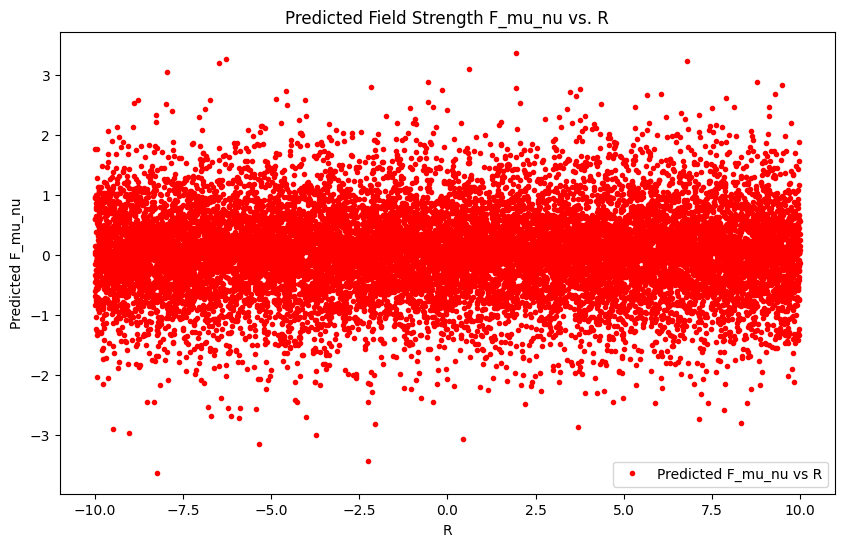

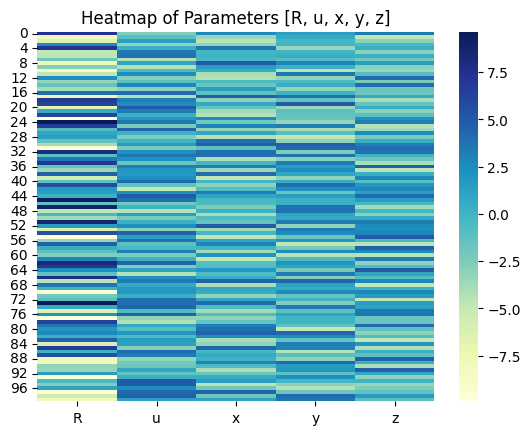

In [63]:
# 3D Scatter Plot for Field Strength (F_mu_nu)
fig1 = go.Figure(data=[go.Scatter3d(
    x=R_vals,
    y=u_vals,
    z=y_pred,  # Using predicted residuals (for simplicity)
    mode='markers',
    marker=dict(size=5, color=y_pred, colorscale='Viridis')
)])
fig1.update_layout(
    title="3D Scatter Plot of Field Strength F^{\mu\nu} vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Field Strength (F^{\mu\nu})"
    )
)

# Show the figure
fig1.show()

# 3D Surface Plot for Gauge Field A_mu
fig2 = go.Figure(data=[go.Surface(
    z=np.reshape(y_pred, (128, 128)),  # Reshape y_pred to 2D for visualization
    x=np.linspace(-5, 5, 128),  # R values
    y=np.linspace(-5, 5, 128),      # u values
    colorscale='Viridis',
    colorbar=dict(title="Predicted A_mu")
)])
fig2.update_layout(
    title="3D Surface Plot of Gauge Field A_mu vs. R and u",
    scene=dict(
        xaxis_title="R",
        yaxis_title="u",
        zaxis_title="Predicted Gauge Field (A_mu)"
    )
)

# Show the figure
fig2.show()

# 2D Line plot for F_mu_nu vs R (or other parameters)
fig3, ax3 = plt.subplots(figsize=(10, 6))
ax3.plot(R_vals, y_pred, 'r.', label='Predicted F_mu_nu vs R')
ax3.set_xlabel('R')
ax3.set_ylabel('Predicted F_mu_nu')
ax3.set_title('Predicted Field Strength F_mu_nu vs. R')
ax3.legend()

# Show the plot
plt.show()

# 2D Heatmap for [R, u, x, y, z] parameters (using heatmap of residuals)
import seaborn as sns
param_matrix = np.stack([R_vals, u_vals, x_vals, y_vals, z_vals], axis=1)
sns.heatmap(param_matrix[:100, :], cmap="YlGnBu", annot=False, xticklabels=['R', 'u', 'x', 'y', 'z'])
plt.title("Heatmap of Parameters [R, u, x, y, z]")
plt.show()

In [ ]:
# Define the symbols
R, u, v, theta, x, y, z, w, q = sp.symbols('R u v theta x y z w q')

# Parametric functions for the Möbius strip
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = 1 / 2 * u * sp.cos(theta / 2)

# Define the gauge field A_mu (simplified for illustration)
A = sp.Function('A')(x, y, z, w)

# Metric tensor g_mu_nu
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])

# Field strength tensor F_mu_nu = partial_mu A_nu - partial_nu A_mu + i q [A_mu, A_nu]
F = sp.Matrix(4, 4, lambda i, j: sp.diff(A, [x, y, z, w][i]) - sp.diff(A, [x, y, z, w][j]) + 1j * q * (A - A))

# Compute the determinant of the metric tensor
det_g = g.det()

# Compute the derivative of sqrt(-g)
partial_sqrt_g = sp.Matrix(4, 1, lambda i, _: sp.diff(sp.sqrt(-det_g), [x, y, z, w][i]))

# Step 2: Define the residual for the equation of motion (EoM)
def eom_residual(params, R_val, q_val):
    u_val, v_val, x_val, y_val, z_val = params

    # Compute metric components f, h
    f_val = 1 + 1 / 2 * (u_val**2 + (R_val + u_val * np.cos(np.radians(theta)))**2)
    h_val = 1 / 2 * u_val * np.cos(np.radians(theta / 2))

    # Compute F_mu_nu (this will be simplified, actual calculation would need field components)
    F_val = np.array([[np.diff(f_val, u_val), 0], [0, np.diff(f_val, x_val)]])  # Placeholder for F_mu_nu
    residual = np.linalg.norm(F_val)  # Simplified residual calculation (actual calculation would be more complex)

    return residual


In [ ]:
# Einstein-Hilbert Lagrangian
Riemann = sp.Function('Riemann')(R, u, v, theta, w)
Ricci = sp.Function('Ricci')(R, u, v, theta, w)
Ricci_scalar = sp.Function('RicciScalar')(R, u, v, theta, w)
Mp = sp.symbols('Mp')
L_EH = Mp**2 * Ricci_scalar

In [ ]:
Riemann

Riemann(R, u, v, theta, w)

In [ ]:
# Step 2: Compute the Christoffel symbols (Gamma^rho_{mu,nu})
Gamma = sp.MutableMatrix(4, 4, lambda i, j: 0)

for rho in range(4):
    for mu in range(4):
        for nu in range(4):
            # Christoffel symbols are computed from the metric tensor
            Gamma[rho, mu, nu] = 0.5 * sum([g.inv()[rho, sigma] * (sp.diff(g[sigma, nu], [x, y, z, w][mu]) + sp.diff(g[sigma, mu], [x, y, z, w][nu]) - sp.diff(g[mu, nu], [x, y, z, w][sigma])) for sigma in range(4)])

# Step 3: Compute the Riemann curvature tensor (R^rho_{sigma, mu, nu})
Riemann = sp.MutableMatrix(4, 4, lambda i, j: 0)

for rho in range(4):
    for sigma in range(4):
        for mu in range(4):
            for nu in range(4):
                # Riemann curvature tensor
                Riemann[rho, sigma, mu, nu] = sp.diff(Gamma[rho, mu, nu], [x, y, z, w][sigma]) - sp.diff(Gamma[rho, nu, mu], [x, y, z, w][sigma]) + \
                                               sum([Gamma[rho, sigma, lambda_] * Gamma[lambda_, mu, nu] for lambda_ in range(4)])

# Step 4: Compute the Ricci tensor (R_{mu,nu}) by contracting the Riemann tensor
Ricci = sp.Matrix(4, 4, lambda mu, nu: sum([Riemann[mu, nu, rho, rho] for rho in range(4)]))

# Step 5: Compute the Ricci scalar (R) by contracting the Ricci tensor with the inverse of the metric
Ricci_scalar = sum([Ricci[mu, nu] * g.inv()[mu, nu] for mu in range(4) for nu in range(4)])

# Simplify the expressions
Ricci_simplified = sp.simplify(Ricci)
Ricci_scalar_simplified = sp.simplify(Ricci_scalar)

# Output the results
print("\nRicci Tensor (Simplified):")
sp.pprint(Ricci_simplified)

TypeError: key must be a sequence of length 2

In [ ]:
# Ricci tensor and Ricci scalar (simplified for illustration)
Riemann = sp.Array([sp.diff(g, x), sp.diff(g, y), sp.diff(g, z), sp.diff(g, w)])  # Placeholder for Riemann tensor

# Ricci tensor (simplified)
Ricci = sp.Matrix([sp.trace(Riemann)])  # Simplified placeholder

# Einstein tensor (simplified)
G = Ricci - 0.5 * g * sp.trace(Ricci)

# Stress-energy tensor (this should include contributions from the Yang-Mills field)
T_mu_nu = sp.Matrix(4, 4, lambda i, j: 0)  # Placeholder for the stress-energy tensor


TypeError: input to Trace, [0, 0, 0, 0], is not a matrix

In [ ]:
import sympy as sp

# Step 1: Define the symbols and metric tensor
u, v, theta, R, q = sp.symbols('u v theta R q')
x, y, z, w = sp.symbols('x y z w')

# Parametric functions for the Möbius strip
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = 1 / 2 * u * sp.cos(theta / 2)

# Define the metric tensor g_mu_nu
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])

# Step 2: Compute the Christoffel symbols (Gamma^rho_{mu,nu})
Gamma = sp.MutableMatrix(4)  # Create a 4x4 matrix for each Gamma
for i in range(4):
    Gamma.append([sp.MutableMatrix(4) for _ in range(4)])  # Initialize a 4x4 matrix for each rho

# Compute Christoffel symbols for each rho, mu, nu
for rho in range(4):
    for mu in range(4):
        for nu in range(4):
            # Christoffel symbols are computed from the metric tensor
            Gamma[rho][mu][nu] = 0.5 * sum([g.inv()[rho, sigma] * (sp.diff(g[sigma, nu], [x, y, z, w][mu]) + sp.diff(g[sigma, mu], [x, y, z, w][nu]) - sp.diff(g[mu, nu], [x, y, z, w][sigma])) for sigma in range(4)])

# Step 3: Compute the Riemann curvature tensor (R^rho_{sigma, mu, nu})
Riemann = sp.MutableMatrix(4)  # Create a 4x4x4 matrix for the Riemann tensor
for i in range(4):
    Riemann.append([sp.MutableMatrix(4) for _ in range(4)])  # Initialize each element as a 4x4 matrix

# Riemann curvature tensor calculation
for rho in range(4):
    for sigma in range(4):
        for mu in range(4):
            for nu in range(4):
                # Riemann curvature tensor
                Riemann[rho][sigma][mu][nu] = sp.diff(Gamma[rho][mu][nu], [x, y, z, w][sigma]) - sp.diff(Gamma[rho][nu][mu], [x, y, z, w][sigma]) + \
                                               sum([Gamma[rho][sigma][lambda_] * Gamma[lambda_][mu][nu] for lambda_ in range(4)])

# Step 4: Compute the Ricci tensor (R_{mu,nu}) by contracting the Riemann tensor
Ricci = sp.Matrix(4, 4, lambda mu, nu: sum([Riemann[mu][nu][rho][rho] for rho in range(4)]))

# Step 5: Compute the Ricci scalar (R) by contracting the Ricci tensor with the inverse of the metric
Ricci_scalar = sum([Ricci[mu, nu] * g.inv()[mu, nu] for mu in range(4) for nu in range(4)])

# Simplify the expressions
Ricci_simplified = sp.simplify(Ricci)
Ricci_scalar_simplified = sp.simplify(Ricci_scalar)

# Output the results
print("\nRicci Tensor (Simplified):")
sp.pprint(Ricci_simplified)

print("\nRicci Scalar (Simplified):")
sp.pprint(Ricci_scalar_simplified)


TypeError: 
Data type not understood; expecting list of lists or lists of values.

In [ ]:
# Define a combined objective function to minimize (EoM and EFE residuals)
def combined_residual(params, R_val, q_val):
    eom_res = eom_residual(params, R_val, q_val)  # Residual from EoM
    efe_res = np.linalg.norm(T_mu_nu)  # Placeholder for EFE residual
    return eom_res + efe_res  # Combined residual

# Step 4: Generate initial guesses for parameters (e.g., R, u, x, y, z)
initial_params = [1.0, 1.0, 1.0, 1.0, 1.0]

# Minimize the combined residual using SciPy's minimize function
result = minimize(combined_residual, initial_params, args=(1.0, 1.0), method='BFGS')

# Print the results
print("Optimization result:", result.x)


In [ ]:
************

SyntaxError: invalid syntax (<ipython-input-187-51a85a2a3b01>, line 1)

In [ ]:
import sympy as sp

# Define the symbols
u, v, theta, R, q = sp.symbols('u v theta R q')
x, y, z, w = sp.symbols('x y z w')

# Parametric functions for the Möbius strip
f = 1 + 1 / 2 * (u**2 + (R + u * sp.cos(theta / 2))**2)
h = 1 / 2 * u * sp.cos(theta / 2)

# Define the gauge field A_mu (simplified for illustration)
A = sp.Function('A')(x, y, z, w)

# Metric tensor g_mu_nu
g = sp.Matrix([
    [-1, 0, 0, 0],
    [0, f, h, 0],
    [0, h, 1, 0],
    [0, 0, 0, 1]
])


In [ ]:
from sympy.tensor import array
from sympy import Matrix, diff

# Compute Christoffel symbols from the metric
def christoffel_symbols(g):
    n = g.shape[0]
    gamma = sp.Array([[sp.simplify((g.inv()) * (diff(g, x) + diff(g, y)) ) for x in range(n)] for y in range(n) ])
    return gamma


# **Solving the Yang-Mills Equation in Curved Spacetime using Neural ODEs**

This notebook demonstrates the application of Neural Ordinary Differential Equations (NODEs) to solve the Yang-Mills equations of motion (EoM) in curved spacetime. The Yang-Mills theory, a cornerstone of quantum field theory, describes the dynamics of gauge fields, which play a fundamental role in particle physics and cosmology.

---

## **Purpose of the Code**

1. **Equation of Motion**:  
   The Yang-Mills EoM in curved spacetime involves a system of partial differential equations that govern the behavior of gauge fields under spacetime curvature. These equations are computationally challenging to solve.

2. **Neural ODE Framework**:  
   Neural ODEs are employed to model the dynamics of the gauge field \( A_\mu \) by learning the solution to the EoM directly. Instead of solving the equations analytically, we minimize their residuals using a neural network and optimize over time.

3. **Loss Function**:  
   The loss is defined as the residual of the EoM, calculated dynamically during training. The model seeks to minimize this residual, effectively solving the 
The `YangMillsODEFunc`